In [2]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec
from pathlib import Path
from tqdm import tqdm
from src.utils import GALAXY_PALETTE, GP, GALAXY_CMAP, SPLIT_COLORS


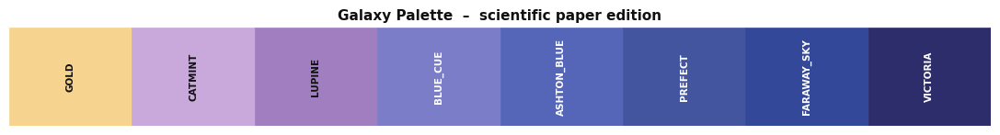

In [3]:
plt.rcParams.update({

    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "savefig.facecolor": "white",
    "savefig.dpi": 300,
    "savefig.bbox": "tight",

    "axes.edgecolor": "#222222",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#111111",
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "axes.titleweight": "bold",
    "axes.prop_cycle": plt.cycler(color=GP),

    "xtick.color": "#222222",
    "ytick.color": "#222222",
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.major.size": 4,
    "ytick.major.size": 4,

    "axes.grid": True,
    "grid.color": "#DDDDDD",
    "grid.linestyle": "--",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.7,

    "text.color": "#111111",
    "font.size": 11,
    "font.family": "sans-serif",

    "legend.frameon": True,
    "legend.framealpha": 0.9,
    "legend.edgecolor": "#CCCCCC",
    "legend.labelcolor": "#111111",
    "legend.fontsize": 10,

    "lines.linewidth": 1.8,
    "patch.linewidth": 0.5,
})

fig, ax = plt.subplots(figsize=(11, 1.6))
for i, (name, hex_val) in enumerate(GALAXY_PALETTE.items()):
    ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=hex_val))

    lum = 0.299*int(hex_val[1:3],16) + 0.587*int(hex_val[3:5],16) + 0.114*int(hex_val[5:7],16)
    txt_col = "#111111" if lum > 140 else "white"
    ax.text(i+0.5, 0.5, name, ha="center", va="center",
            fontsize=7.5, color=txt_col, fontweight="bold", rotation=90)
ax.set_xlim(0, 8); ax.set_ylim(0, 1); ax.axis("off")
ax.set_title("Galaxy Palette  –  scientific paper edition", fontsize=11, color="#111111", pad=6)
plt.tight_layout(); plt.show()

In [4]:
from src.data_loader import TRAIN_PATH, VAL_PATH, TEST_PATH

SPLIT_PATHS = {"train": TRAIN_PATH, "val": VAL_PATH, "test": TEST_PATH}
ALL_PATHS = list(SPLIT_PATHS.values())

for split, p in SPLIT_PATHS.items():
    exists = Path(p).exists()
    print(f"  {split:6s} → {p}  [{'OK' if exists else 'MISSING'}]")


  train  → /Users/arpinejanunts/Desktop/Capstone/data/5x127x127_training_with_morphology.hdf5  [OK]
  val    → /Users/arpinejanunts/Desktop/Capstone/data/5x127x127_validation_with_morphology.hdf5  [OK]
  test   → /Users/arpinejanunts/Desktop/Capstone/data/5x127x127_testing_with_morphology.hdf5  [OK]


In [5]:
def _tree(h5obj):
    lines = []
    def visit(name, obj):
        if isinstance(obj, h5py.Group):
            lines.append(f"GROUP   {name}")
        elif isinstance(obj, h5py.Dataset):
            lines.append(f"DATASET {name}  shape={tuple(obj.shape)}  dtype={obj.dtype}")
    h5obj.visititems(visit)
    return "\n".join(lines)

def _normalize_img(img):
    x = img.astype(np.float32)
    mn, mx = np.nanmin(x), np.nanmax(x)
    if not np.isfinite(mn) or not np.isfinite(mx) or mx - mn < 1e-12:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn)

def norm01(img2d):
    a = img2d.astype(np.float32, copy=False)
    mn, mx = np.nanmin(a), np.nanmax(a)
    if not np.isfinite(mn) or not np.isfinite(mx) or mx - mn < 1e-12:
        return np.zeros_like(a, dtype=np.float32)
    return (a - mn) / (mx - mn)

def load_key(key, paths=ALL_PATHS, dtype=np.float64):
    arrays = []
    for p in paths:
        with h5py.File(p, "r") as f:
            if key in f:
                arrays.append(np.array(f[key][:], dtype=dtype))
    return np.concatenate(arrays) if arrays else np.array([], dtype=dtype)

def load_keys(keys, paths=ALL_PATHS, dtype=np.float64):
    return {k: load_key(k, paths, dtype) for k in keys}

def sample_images_and_z(paths, n_sample, seed=42):
    rng = np.random.default_rng(seed)
    sizes = []
    for p in paths:
        with h5py.File(p, "r") as f:
            sizes.append(int(f["image"].shape[0]))
    total = sum(sizes)
    n_sample = min(n_sample, total)
    global_idxs = np.sort(rng.choice(total, size=n_sample, replace=False))
    imgs_out, zs_out, splits_out = [], [], []
    offsets = np.concatenate([[0], np.cumsum(sizes)])
    split_names = list(SPLIT_PATHS.keys())
    for fi, p in enumerate(paths):
        mask = (global_idxs >= offsets[fi]) & (global_idxs < offsets[fi+1])
        local = (global_idxs[mask] - offsets[fi]).astype(np.int64)
        if local.size == 0: continue
        with h5py.File(p, "r") as f:
            for li in local:
                imgs_out.append(np.array(f["image"][int(li)], dtype=np.float32))
                zs_out.append(float(f["specz_redshift"][int(li)]))
                splits_out.append(split_names[fi])
    return np.stack(imgs_out), np.array(zs_out), np.array(splits_out)

split_sizes = {}
for split, p in SPLIT_PATHS.items():
    with h5py.File(p, "r") as f:
        split_sizes[split] = int(f["specz_redshift"].shape[0])
total = sum(split_sizes.values())
for split, n in split_sizes.items():
    print(f"  {split:6s}: {n:>7,} samples  ({n/total*100:.1f}%)")
print(f"  {'total':6s}: {total:>7,} samples")

  train : 204,573 samples  (71.4%)
  val   :  40,914 samples  (14.3%)
  test  :  40,914 samples  (14.3%)
  total : 286,401 samples


In [6]:
print("=== HDF5 structure (training file) ===")
with h5py.File(SPLIT_PATHS["train"], "r") as f:
    print(_tree(f))

=== HDF5 structure (training file) ===
DATASET coord  shape=(204573, 1)  dtype=|S60
DATASET dec  shape=(204573,)  dtype=float64
DATASET g_central_image_pop_10px_rad  shape=(204573,)  dtype=int64
DATASET g_central_image_pop_15px_rad  shape=(204573,)  dtype=int64
DATASET g_central_image_pop_5px_rad  shape=(204573,)  dtype=int64
DATASET g_cmodel_mag  shape=(204573,)  dtype=float64
DATASET g_cmodel_magsigma  shape=(204573,)  dtype=float64
DATASET g_ellipticity  shape=(204573,)  dtype=float64
DATASET g_half_light_radius  shape=(204573,)  dtype=float64
DATASET g_isophotal_area  shape=(204573,)  dtype=float64
DATASET g_major_axis  shape=(204573,)  dtype=float64
DATASET g_minor_axis  shape=(204573,)  dtype=float64
DATASET g_peak_surface_brightness  shape=(204573,)  dtype=float64
DATASET g_petro_rad  shape=(204573,)  dtype=float64
DATASET g_pos_angle  shape=(204573,)  dtype=float64
DATASET g_sersic_index  shape=(204573,)  dtype=float64
DATASET i_central_image_pop_10px_rad  shape=(204573,)  dtyp

In [7]:
feature_keys = [
    'g_cmodel_mag','g_cmodel_magsigma',
    'g_central_image_pop_5px_rad','g_central_image_pop_10px_rad','g_central_image_pop_15px_rad',
    'g_ellipticity','g_half_light_radius','g_isophotal_area','g_major_axis','g_minor_axis',
    'g_peak_surface_brightness','g_petro_rad','g_pos_angle','g_sersic_index',
    'r_cmodel_mag','r_cmodel_magsigma',
    'r_central_image_pop_5px_rad','r_central_image_pop_10px_rad','r_central_image_pop_15px_rad',
    'r_ellipticity','r_half_light_radius','r_isophotal_area','r_major_axis','r_minor_axis',
    'r_peak_surface_brightness','r_petro_rad','r_pos_angle','r_sersic_index',
    'i_cmodel_mag','i_cmodel_magsigma',
    'i_central_image_pop_5px_rad','i_central_image_pop_10px_rad','i_central_image_pop_15px_rad',
    'i_ellipticity','i_half_light_radius','i_isophotal_area','i_major_axis','i_minor_axis',
    'i_peak_surface_brightness','i_petro_rad','i_pos_angle','i_sersic_index',
    'z_cmodel_mag','z_cmodel_magsigma',
    'z_central_image_pop_5px_rad','z_central_image_pop_10px_rad','z_central_image_pop_15px_rad',
    'z_ellipticity','z_half_light_radius','z_isophotal_area','z_major_axis','z_minor_axis',
    'z_peak_surface_brightness','z_petro_rad','z_pos_angle','z_sersic_index',
    'y_cmodel_mag','y_cmodel_magsigma',
    'y_central_image_pop_5px_rad','y_central_image_pop_10px_rad','y_central_image_pop_15px_rad',
    'y_ellipticity','y_half_light_radius','y_isophotal_area','y_major_axis','y_minor_axis',
    'y_peak_surface_brightness','y_petro_rad','y_pos_angle','y_sersic_index',
    'specz_mag_i'
]

data = load_keys(feature_keys + ['specz_redshift','specz_flag_homogeneous','specz_redshift_err'])
df = pd.DataFrame(data)
df_clean = df[df['specz_flag_homogeneous'] == True].reset_index(drop=True)
print(f"Total samples (all splits):   {len(df):,}")
print(f"After flag filter (reliable): {len(df_clean):,}")
print(f"\nspecz_flag breakdown:")
print(df['specz_flag_homogeneous'].value_counts())

Total samples (all splits):   286,401
After flag filter (reliable): 286,401

specz_flag breakdown:
specz_flag_homogeneous
1.0    286401
Name: count, dtype: int64


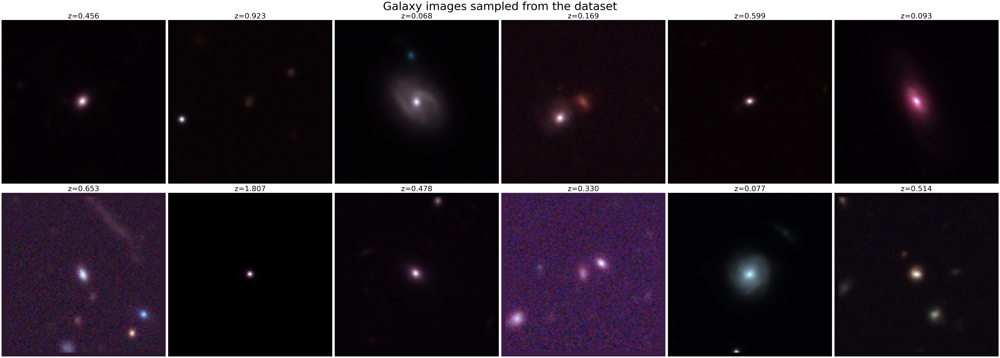

In [18]:
BAND_NAMES = ["u", "g", "r", "i", "z"]
imgs, zs, split_labels = sample_images_and_z(ALL_PATHS, n_sample=12, seed=7)
                                                                                                                                        
fig, axes = plt.subplots(2, 6, figsize=(64, 24))
axes = axes.ravel()
for k in range(12):
    rgb = np.stack([norm01(imgs[k][1]), norm01(imgs[k][2]), norm01(imgs[k][3])], axis=-1)
    axes[k].imshow(rgb)
    axes[k].set_title(f"z={zs[k]:.3f}", fontsize=34, fontweight="normal", color="black")
    axes[k].axis("off")
                                                                                                                                        
fig.suptitle("Galaxy images sampled from the dataset", fontsize=52, color="black")
plt.tight_layout()
plt.savefig("galaxy_grid_large.png", dpi=300, bbox_inches="tight")
plt.show()

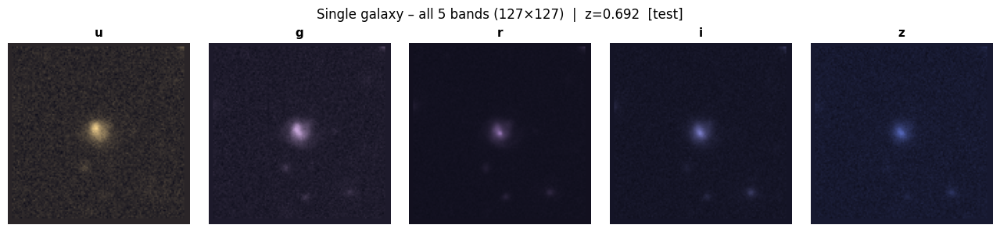

In [124]:
imgs_s, zs_s, sl_s = sample_images_and_z(ALL_PATHS, n_sample=1, seed=99)
chw = imgs_s[0]

fig, axes = plt.subplots(1, 5, figsize=(13, 3))
band_cmaps = [
    LinearSegmentedColormap.from_list("b0", ["#0D0D1A", GP[0]]),
    LinearSegmentedColormap.from_list("b1", ["#0D0D1A", GP[1]]),
    LinearSegmentedColormap.from_list("b2", ["#0D0D1A", GP[2]]),
    LinearSegmentedColormap.from_list("b3", ["#0D0D1A", GP[3]]),
    LinearSegmentedColormap.from_list("b4", ["#0D0D1A", GP[4]]),
]
for c, ax in enumerate(axes):
    ax.imshow(norm01(chw[c]), cmap=band_cmaps[c], origin="upper")
    ax.set_title(BAND_NAMES[c], fontsize=11, color="black")
    ax.axis("off")
fig.suptitle(f"Single galaxy – all 5 bands (127×127)  |  z={zs_s[0]:.3f}  [{sl_s[0]}]", fontsize=12, color="black")
plt.tight_layout(); plt.show()

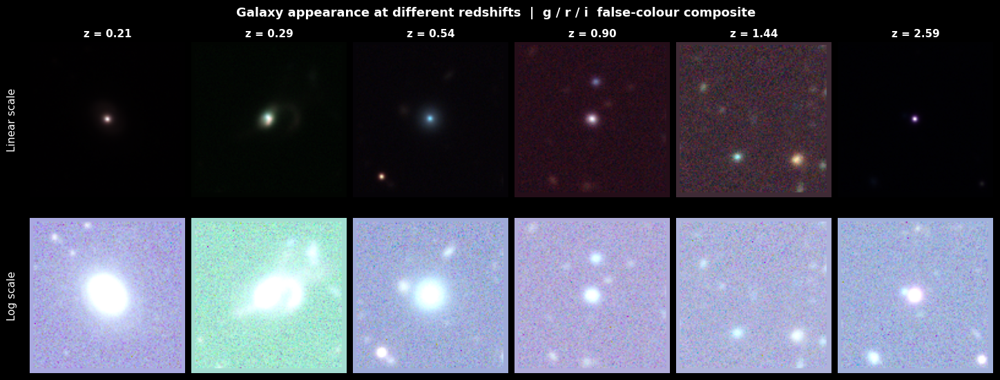

In [125]:

def log_stretch(band):
    """Map a single band to [0,1] with log compression."""
    a = band.astype(np.float32)
    a = a - np.nanmin(a)
    a = np.log1p(a * 100) / np.log1p(100)
    return np.clip(a, 0, 1)

def make_rgb(chw, stretch="linear"):
    """Return 127x127x3 RGB array (g->R, r->G, i->B)."""
    fn = log_stretch if stretch == "log" else norm01
    return np.stack([fn(chw[1]), fn(chw[2]), fn(chw[3])], axis=-1)

def sample_near_z(target_z, n=1, tol=0.12, seed=None):
    """Return up to n (image, z) pairs with |z - target_z| < tol."""
    rng = np.random.default_rng(seed if seed is not None else int(target_z * 1000))
    imgs_out, zs_out = [], []
    for p in ALL_PATHS:
        with h5py.File(p, "r") as f:
            z_arr = np.array(f["specz_redshift"][:], dtype=np.float32)
            idxs = np.where(np.abs(z_arr - target_z) < tol)[0]
            if idxs.size == 0:
                continue
            need = n - len(imgs_out)
            chosen = rng.choice(idxs, size=min(need, idxs.size), replace=False)
            for idx in chosen:
                imgs_out.append(np.array(f["image"][int(idx)], dtype=np.float32))
                zs_out.append(float(z_arr[int(idx)]))
        if len(imgs_out) >= n:
            break
    return imgs_out, zs_out

Z_BINS = [0.1, 0.3, 0.6, 1.0, 1.5, 2.5]
Z_TOL = 0.12

bin_data = {}
for tz in Z_BINS:
    imgs, zvals = sample_near_z(tz, n=1, tol=Z_TOL, seed=int(tz * 100) + 7)
    if imgs:
        bin_data[tz] = (imgs[0], zvals[0])

ncols = len(bin_data)
fig, axes = plt.subplots(2, ncols, figsize=(3.0 * ncols, 6.2))
fig.patch.set_facecolor("black")

for col, (tz, (chw, zval)) in enumerate(bin_data.items()):
    for row, stretch in enumerate(["linear", "log"]):
        ax = axes[row, col]
        ax.set_facecolor("black")
        ax.imshow(make_rgb(chw, stretch), origin="upper")
        ax.axis("off")
        if row == 0:
            ax.set_title(f"z = {zval:.2f}", color="white",
                         fontsize=11, fontweight="bold", pad=5)

for row, label in enumerate(["Linear scale", "Log scale"]):
    axes[row, 0].text(
        -0.08, 0.5, label, transform=axes[row, 0].transAxes,
        color="white", fontsize=11, rotation=90,
        va="center", ha="right"
    )

fig.suptitle(
    "Galaxy appearance at different redshifts  |  g / r / i  false-colour composite",
    color="white", fontsize=13, fontweight="bold", y=0.98
)
plt.subplots_adjust(wspace=0.04, hspace=0.06, top=0.91)
plt.show()

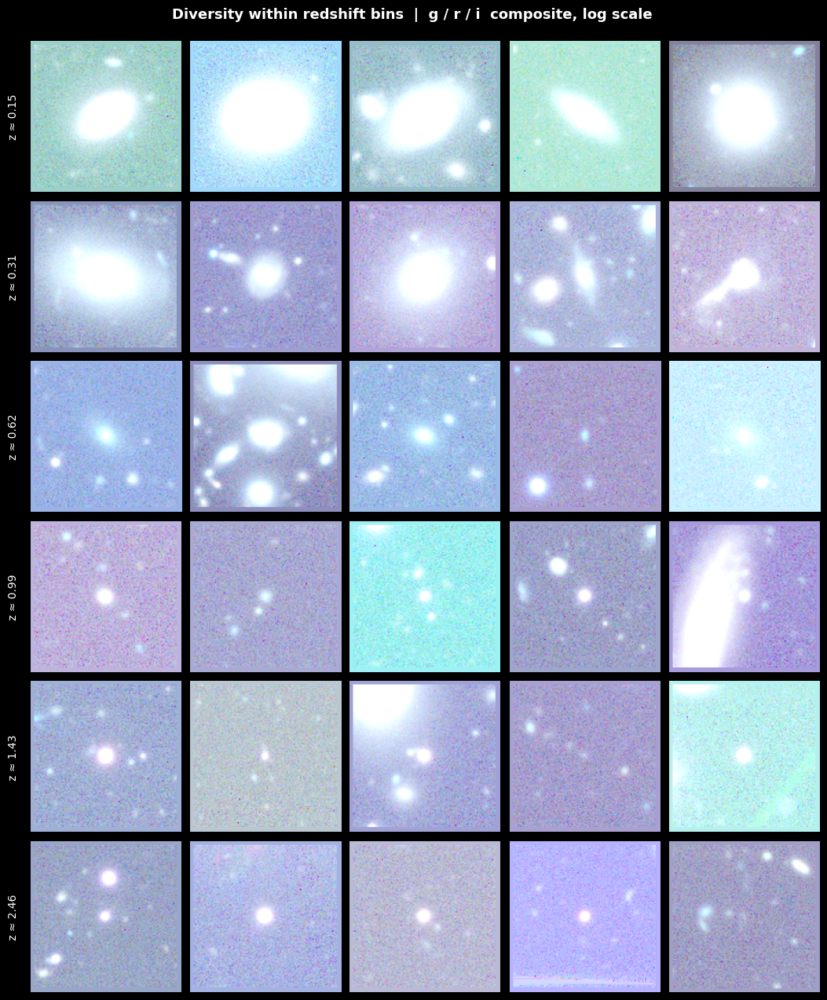

In [ ]:
N_PER_BIN = 5

fig, axes = plt.subplots(
    len(Z_BINS), N_PER_BIN,
    figsize=(2.6 * N_PER_BIN, 2.4 * len(Z_BINS))
)
fig.patch.set_facecolor("black")

for row, tz in enumerate(Z_BINS):
    imgs, zvals = sample_near_z(tz, n=N_PER_BIN, tol=Z_TOL, seed=int(tz * 100) + 42)
    for col in range(N_PER_BIN):
        ax = axes[row, col]
        ax.set_facecolor("black")
        if col < len(imgs):
            ax.imshow(make_rgb(imgs[col], "log"), origin="upper")
        ax.axis("off")

    mean_z = float(np.mean(zvals)) if zvals else tz
    axes[row, 0].text(
        -0.08, 0.5, f"z ≈ {mean_z:.2f}",
        transform=axes[row, 0].transAxes,
        color="white", fontsize=10, rotation=90,
        va="center", ha="right"
    )

fig.suptitle(
    "Diversity within redshift bins  |  g / r / i  composite, log scale",
    color="white", fontsize=13, fontweight="bold"
)
plt.subplots_adjust(wspace=0.04, hspace=0.06, top=0.95)
plt.show()

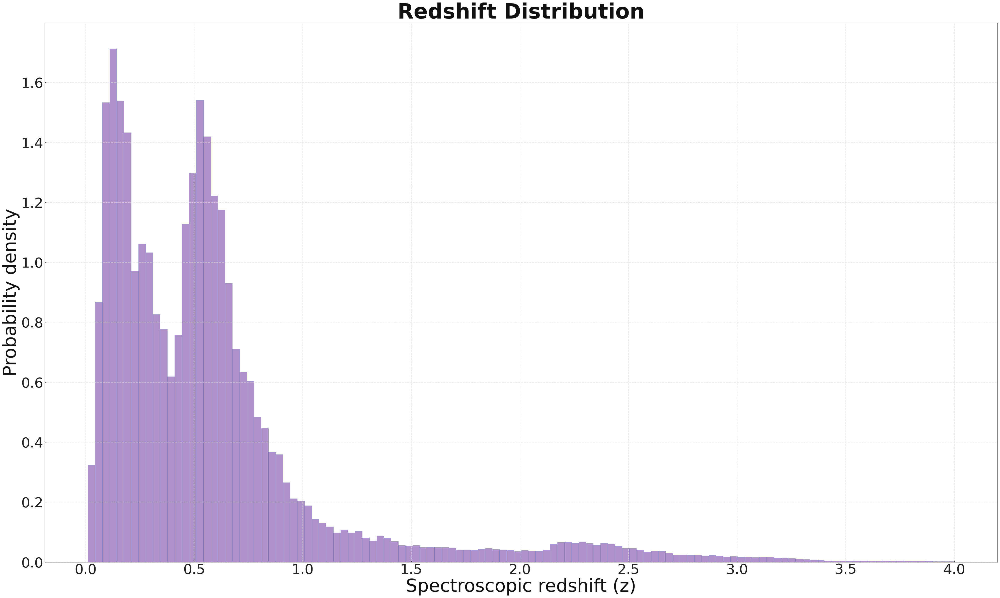

  min  : 0.0101
  max  : 3.9997
  mean : 0.5934
  std  : 0.5707


In [16]:
z_all = load_key("specz_redshift")
z_all = z_all[np.isfinite(z_all)]

fig, ax = plt.subplots(figsize=(40, 24))
ax.hist(z_all, bins=120, density=True, color=GP[2], alpha=0.85, edgecolor=GP[4], linewidth=0.4)
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=52)
ax.set_ylabel("Probability density", fontsize=52)
ax.set_title("Redshift Distribution", fontsize=60)
ax.tick_params(axis='both', labelsize=40)
ax.grid(True, linewidth=1.5)
plt.tight_layout()
plt.savefig("redshift_distribution_large.png", dpi=300, bbox_inches="tight")
plt.show()

print(f"  min  : {z_all.min():.4f}")
print(f"  max  : {z_all.max():.4f}")
print(f"  mean : {z_all.mean():.4f}")
print(f"  std  : {z_all.std():.4f}")

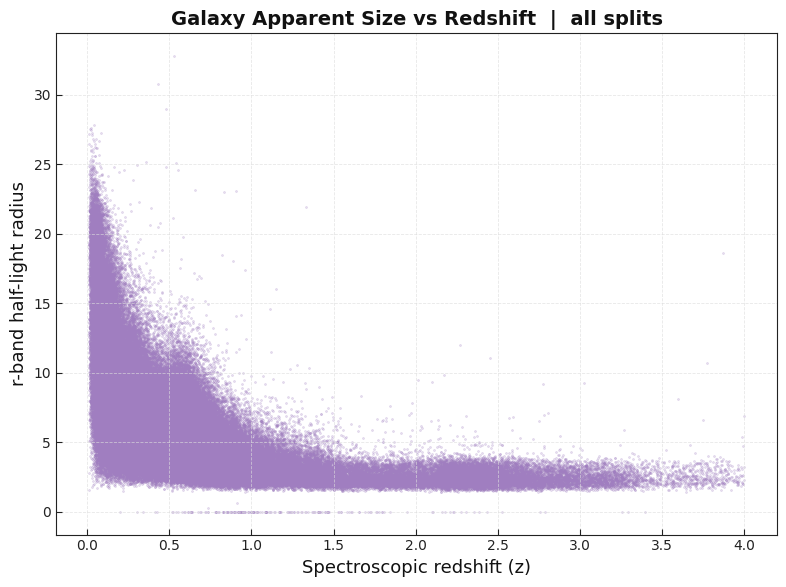

In [88]:
dat = load_keys(["specz_redshift","r_half_light_radius"])
z, r = dat["specz_redshift"], dat["r_half_light_radius"]
mask = np.isfinite(z) & np.isfinite(r)

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(z[mask], r[mask], s=2, alpha=0.25, color=GP[2], rasterized=True)
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("r-band half-light radius", fontsize=13)
ax.set_title("Galaxy Apparent Size vs Redshift  |  all splits", fontsize=14)
ax.grid(True); plt.tight_layout(); plt.show()

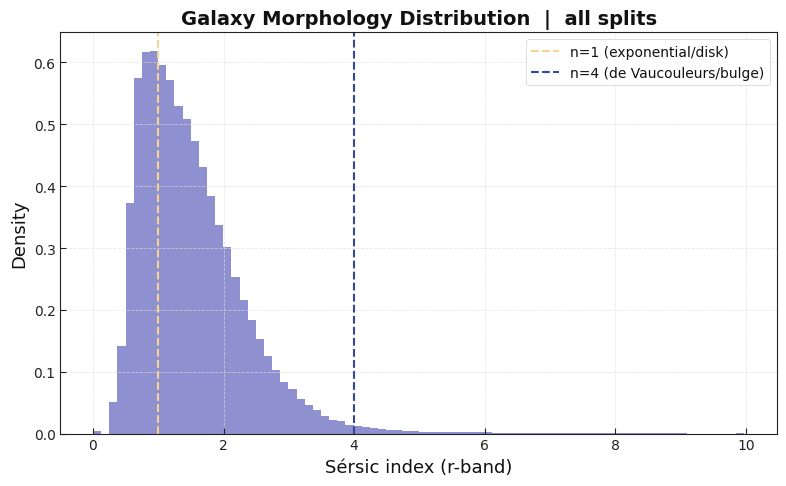

In [89]:
n = load_key("r_sersic_index")
n = n[np.isfinite(n)]

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(n, bins=80, density=True, color=GP[3], alpha=0.85, edgecolor="none")
ax.axvline(1.0, linestyle="--", linewidth=1.5, color=GP[0], label="n=1 (exponential/disk)")
ax.axvline(4.0, linestyle="--", linewidth=1.5, color=GP[6], label="n=4 (de Vaucouleurs/bulge)")
ax.set_xlabel("Sérsic index (r-band)", fontsize=13)
ax.set_ylabel("Density", fontsize=13)
ax.set_title("Galaxy Morphology Distribution  |  all splits", fontsize=14)
ax.legend(fontsize=10); ax.grid(True); plt.tight_layout(); plt.show()

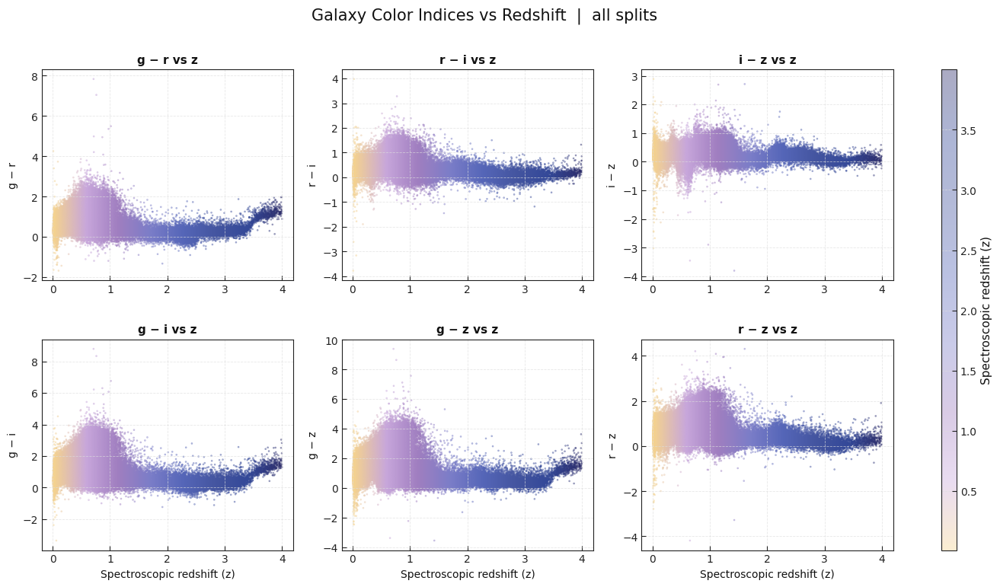

In [90]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag","z_cmodel_mag"])
z, g, r, i_mag, zmag = (dat[k] for k in ["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag","z_cmodel_mag"])

color_pairs = [
    ("g − r", g-r), ("r − i", r-i_mag), ("i − z", i_mag-zmag),
    ("g − i", g-i_mag), ("g − z", g-zmag), ("r − z", r-zmag),
]

fig = plt.figure(figsize=(15.5, 8.2))
gs = GridSpec(2, 4, width_ratios=[1,1,1,0.06], wspace=0.25, hspace=0.28)
axes = [fig.add_subplot(gs[row, col]) for row in range(2) for col in range(3)]
cax = fig.add_subplot(gs[:, 3])
sc_last = None
for ax, (label, cval) in zip(axes, color_pairs):
    m = np.isfinite(z) & np.isfinite(cval)
    sc_last = ax.scatter(z[m], cval[m], c=z[m], s=2, alpha=0.4, cmap=GALAXY_CMAP, rasterized=True)
    ax.set_title(f"{label} vs z", fontsize=11); ax.set_ylabel(label, fontsize=10); ax.grid(True)
for ax in axes[3:]:
    ax.set_xlabel("Spectroscopic redshift (z)", fontsize=10)
fig.suptitle("Galaxy Color Indices vs Redshift  |  all splits", fontsize=15)
cbar = fig.colorbar(sc_last, cax=cax); cbar.set_label("Spectroscopic redshift (z)", fontsize=11)
plt.show()

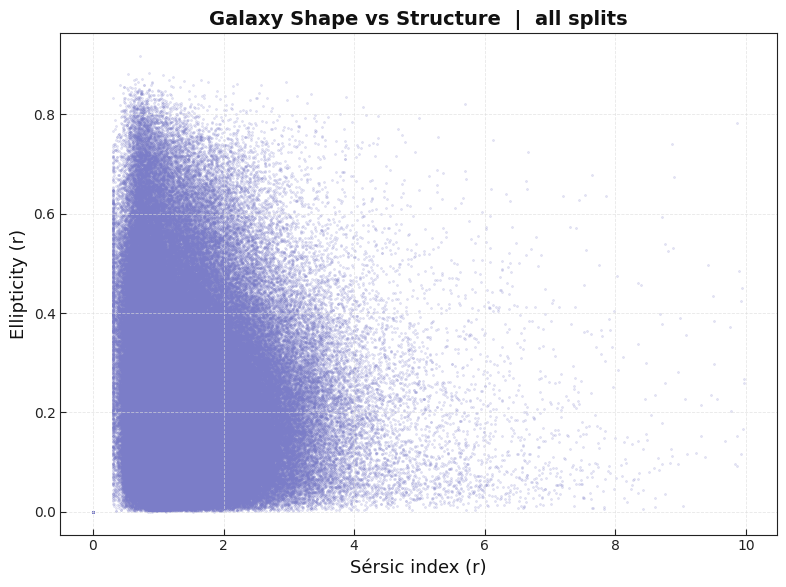

In [91]:
dat = load_keys(["r_ellipticity","r_sersic_index"])
e, n = dat["r_ellipticity"], dat["r_sersic_index"]
mask = np.isfinite(e) & np.isfinite(n)

fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(n[mask], e[mask], s=2, alpha=0.2, color=GP[3], rasterized=True)
ax.set_xlabel("Sérsic index (r)", fontsize=13); ax.set_ylabel("Ellipticity (r)", fontsize=13)
ax.set_title("Galaxy Shape vs Structure  |  all splits", fontsize=14)
ax.grid(True); plt.tight_layout(); plt.show()

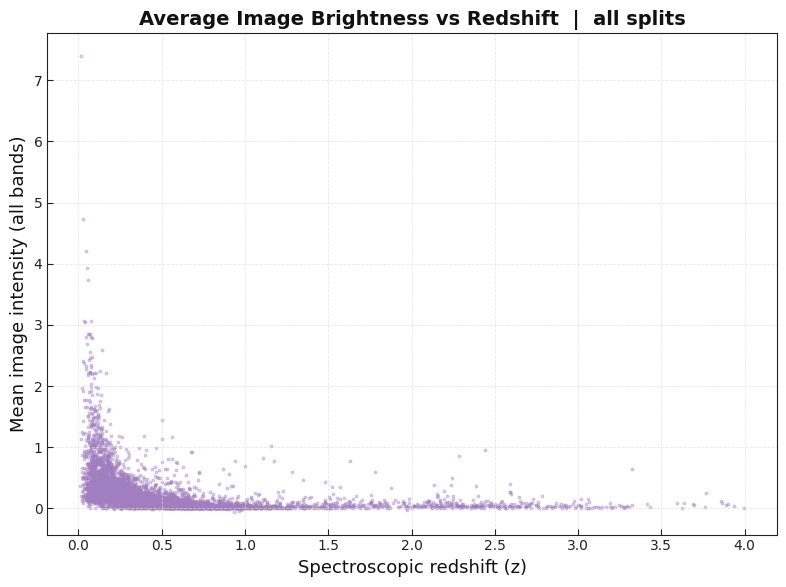

In [92]:
step = 50
z_list, m_list = [], []
for p in ALL_PATHS:
    with h5py.File(p, "r") as f:
        img_ds, z_ds = f["image"], f["specz_redshift"]
        n_file = int(z_ds.shape[0])
        for i in tqdm(np.arange(0, n_file, step, dtype=np.int64),
                      desc=f"Brightness ({p.split('/')[-1][:5]})", unit="img", leave=False):
            img = np.array(img_ds[int(i)], dtype=np.float32)
            zv = float(np.array(z_ds[int(i)], dtype=np.float64))
            if np.isfinite(zv): z_list.append(zv); m_list.append(float(np.mean(img)))

z_arr, m_arr = np.array(z_list), np.array(m_list)
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(z_arr, m_arr, s=5, alpha=0.4, color=GP[2], rasterized=True)
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("Mean image intensity (all bands)", fontsize=13)
ax.set_title("Average Image Brightness vs Redshift  |  all splits", fontsize=14)
ax.grid(True); plt.tight_layout(); plt.show()

/var/folders/69/w3lrlv056t9dlrj1sbkzhvyc0000gn/T/ipykernel_34175/84294146.py:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.96]); plt.show()


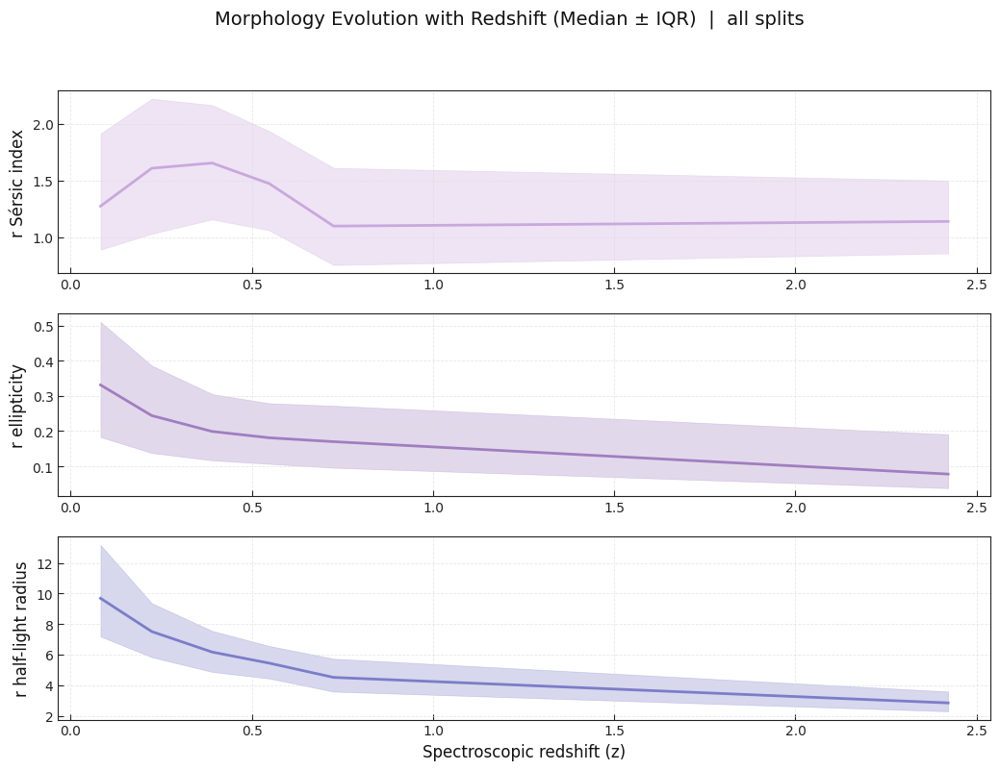

In [93]:
dat = load_keys(["specz_redshift","r_sersic_index","r_ellipticity","r_half_light_radius"])
z, n, e, hlr = (dat[k] for k in ["specz_redshift","r_sersic_index","r_ellipticity","r_half_light_radius"])
m = np.isfinite(z) & np.isfinite(n) & np.isfinite(e) & np.isfinite(hlr)
z, n, e, hlr = z[m], n[m], e[m], hlr[m]

bins = np.quantile(z, np.linspace(0, 1, 7))
z_cent = 0.5*(bins[:-1]+bins[1:])
stats = {k: ([],[],[]) for k in ['n','e','h']}
for i in range(6):
    sel = (z>=bins[i])&(z<bins[i+1]) if i<5 else (z>=bins[i])&(z<=bins[i+1])
    for arr, key in [(n,'n'),(e,'e'),(hlr,'h')]:
        v = arr[sel]
        stats[key][0].append(np.median(v)); stats[key][1].append(np.quantile(v,0.25)); stats[key][2].append(np.quantile(v,0.75))

fig = plt.figure(figsize=(12.5, 8.5))
gs = GridSpec(3, 1, hspace=0.22)
labels = ["r Sérsic index","r ellipticity","r half-light radius"]
for i,(key,ylab) in enumerate(zip(['n','e','h'], labels)):
    ax = fig.add_subplot(gs[i, 0])
    ax.fill_between(z_cent, stats[key][1], stats[key][2], alpha=0.3, color=GP[i+1])
    ax.plot(z_cent, stats[key][0], linewidth=2, color=GP[i+1])
    ax.set_ylabel(ylab, fontsize=12); ax.grid(True)
    if i == 2: ax.set_xlabel("Spectroscopic redshift (z)", fontsize=12)
fig.suptitle("Morphology Evolution with Redshift (Median ± IQR)  |  all splits", fontsize=14)
plt.tight_layout(rect=[0,0,1,0.96]); plt.show()

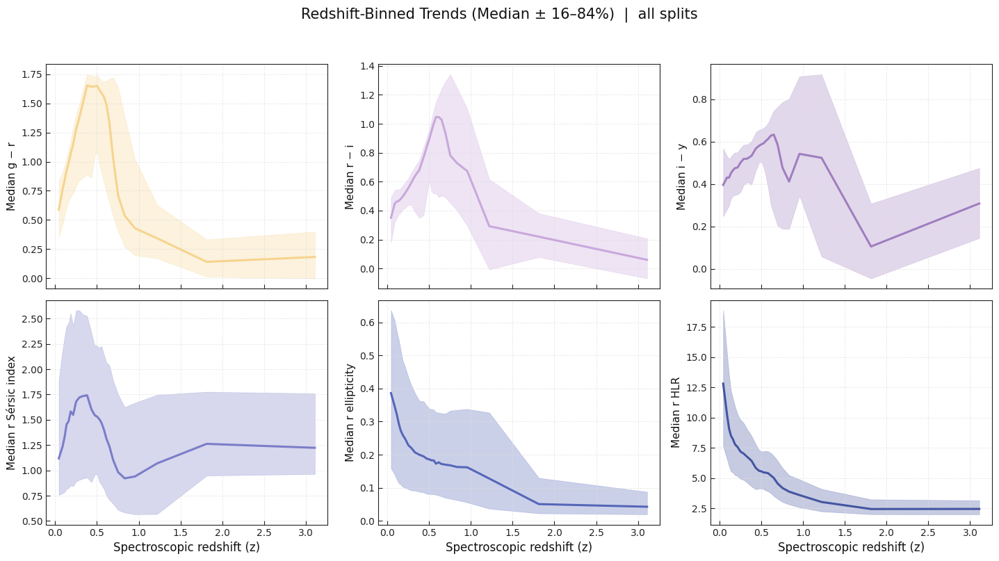

In [94]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag","y_cmodel_mag",
                  "r_sersic_index","r_ellipticity","r_half_light_radius"])
z,g,r,i_mag,y_mag = (dat[k] for k in ["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag","y_cmodel_mag"])
n, e, hlr = dat["r_sersic_index"], dat["r_ellipticity"], dat["r_half_light_radius"]
gr, ri, iy = g-r, r-i_mag, i_mag-y_mag
m = np.isfinite(z)&np.isfinite(gr)&np.isfinite(ri)&np.isfinite(iy)&np.isfinite(n)&np.isfinite(e)&np.isfinite(hlr)
z,gr,ri,iy,n,e,hlr = z[m],gr[m],ri[m],iy[m],n[m],e[m],hlr[m]

nb2 = 26; bins = np.quantile(z, np.linspace(0,1,nb2+1)); zc = 0.5*(bins[:-1]+bins[1:])

def binned_stats(x, y, bins):
    med,lo,hi = [np.full(len(bins)-1,np.nan) for _ in range(3)]
    for k in range(len(bins)-1):
        sel = (x>=bins[k])&(x<bins[k+1]) if k<len(bins)-2 else (x>=bins[k])&(x<=bins[k+1])
        v = y[sel]
        if v.size >= 20: med[k]=np.median(v); lo[k]=np.quantile(v,0.16); hi[k]=np.quantile(v,0.84)
    return med, lo, hi

series_data = [
    ("Median g − r", *binned_stats(z,gr,bins)),
    ("Median r − i", *binned_stats(z,ri,bins)),
    ("Median i − y", *binned_stats(z,iy,bins)),
    ("Median r Sérsic index", *binned_stats(z,n,bins)),
    ("Median r ellipticity", *binned_stats(z,e,bins)),
    ("Median r HLR", *binned_stats(z,hlr,bins)),
]

fig, axes = plt.subplots(2, 3, figsize=(14.5, 8.2), sharex=True)
axes = axes.ravel()
for (ax, (ylab, med, lo, hi)), col in zip(zip(axes, series_data), GP):
    ok = np.isfinite(med)&np.isfinite(lo)&np.isfinite(hi)
    ax.fill_between(zc[ok], lo[ok], hi[ok], alpha=0.3, color=col)
    ax.plot(zc[ok], med[ok], linewidth=2.2, color=col)
    ax.set_ylabel(ylab, fontsize=11); ax.grid(True)
for ax in axes[3:]: ax.set_xlabel("Spectroscopic redshift (z)", fontsize=12)
fig.suptitle("Redshift-Binned Trends (Median ± 16–84%)  |  all splits", fontsize=15)
plt.tight_layout(rect=[0,0,1,0.95]); plt.show()

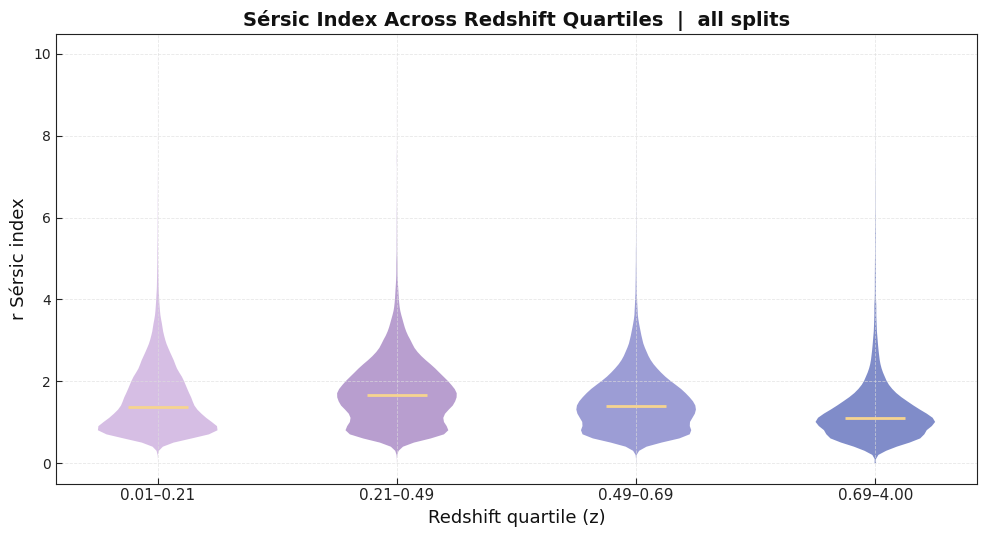

In [95]:
dat = load_keys(["specz_redshift","r_sersic_index"])
z, n = dat["specz_redshift"], dat["r_sersic_index"]
m = np.isfinite(z)&np.isfinite(n); z, n = z[m], n[m]

q = np.quantile(z,[0,0.25,0.5,0.75,1.0])
data, labels = [], []
for i in range(4):
    sel = (z>=q[i])&(z<=q[i+1]) if i==3 else (z>=q[i])&(z<q[i+1])
    data.append(n[sel]); labels.append(f"{q[i]:.2f}–{q[i+1]:.2f}")

fig, ax = plt.subplots(figsize=(10, 5.5))
vp = ax.violinplot(data, showmedians=True, showextrema=False)
for i, body in enumerate(vp["bodies"]):
    body.set_facecolor(GP[i+1]); body.set_alpha(0.75)
vp["cmedians"].set_colors(GP[0]); vp["cmedians"].set_linewidth(2)
ax.set_xticks(np.arange(1,5)); ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel("r Sérsic index", fontsize=13)
ax.set_xlabel("Redshift quartile (z)", fontsize=13)
ax.set_title("Sérsic Index Across Redshift Quartiles  |  all splits", fontsize=14)
ax.grid(True, axis="y"); plt.tight_layout(); plt.show()

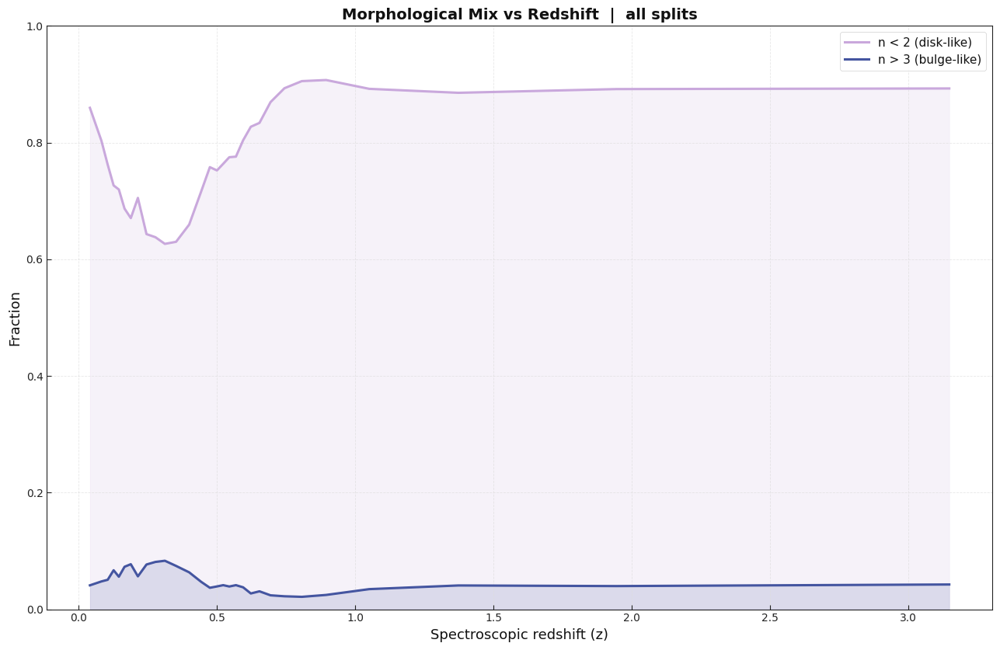

In [12]:
dat = load_keys(["specz_redshift","r_sersic_index"])
z, n = dat["specz_redshift"], dat["r_sersic_index"]
m = np.isfinite(z)&np.isfinite(n); z, n = z[m], n[m]

nb2 = 30; bins = np.quantile(z, np.linspace(0,1,nb2+1)); zc = 0.5*(bins[:-1]+bins[1:])
frac_disk, frac_bulge = np.full(nb2,np.nan), np.full(nb2,np.nan)
for k in range(nb2):
    sel = (z>=bins[k])&(z<bins[k+1]) if k<nb2-1 else (z>=bins[k])&(z<=bins[k+1])
    v = n[sel]
    if v.size >= 30: frac_disk[k]=np.mean(v<2); frac_bulge[k]=np.mean(v>3)

fig, ax = plt.subplots(figsize=(13, 8.5))
ok1, ok2 = np.isfinite(frac_disk), np.isfinite(frac_bulge)
ax.plot(zc[ok1], frac_disk[ok1], linewidth=2.2, color=GP[1], label="n < 2 (disk-like)")
ax.plot(zc[ok2], frac_bulge[ok2], linewidth=2.2, color=GP[5], label="n > 3 (bulge-like)")
ax.fill_between(zc[ok1], 0, frac_disk[ok1], alpha=0.15, color=GP[1])
ax.fill_between(zc[ok2], 0, frac_bulge[ok2], alpha=0.15, color=GP[5])
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("Fraction", fontsize=13)
ax.set_title("Morphological Mix vs Redshift  |  all splits", fontsize=14)
ax.set_ylim(0,1); ax.grid(True); ax.legend(fontsize=11); plt.tight_layout(); plt.show()

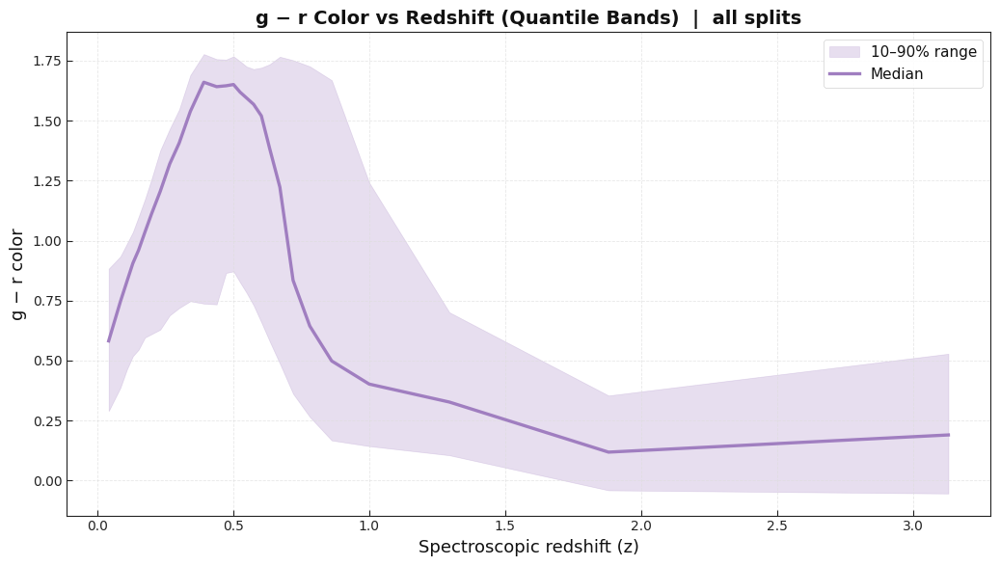

In [97]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag"])
z, g, r = dat["specz_redshift"], dat["g_cmodel_mag"], dat["r_cmodel_mag"]
gr = g-r; m = np.isfinite(z)&np.isfinite(gr); z, gr = z[m], gr[m]

nb2 = 28; bins = np.quantile(z, np.linspace(0,1,nb2+1)); zc = 0.5*(bins[:-1]+bins[1:])
q10, q50, q90 = [np.full(nb2,np.nan) for _ in range(3)]
for k in range(nb2):
    sel = (z>=bins[k])&(z<bins[k+1]) if k<nb2-1 else (z>=bins[k])&(z<=bins[k+1])
    v = gr[sel]
    if v.size>=30: q10[k],q50[k],q90[k] = np.quantile(v,[0.10,0.50,0.90])

ok = np.isfinite(q50)
fig, ax = plt.subplots(figsize=(10.5, 6))
ax.fill_between(zc[ok], q10[ok], q90[ok], alpha=0.25, color=GP[2], label="10–90% range")
ax.plot(zc[ok], q50[ok], linewidth=2.4, color=GP[2], label="Median")
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("g − r color", fontsize=13)
ax.set_title("g − r Color vs Redshift (Quantile Bands)  |  all splits", fontsize=14)
ax.grid(True); ax.legend(fontsize=11); plt.tight_layout(); plt.show()

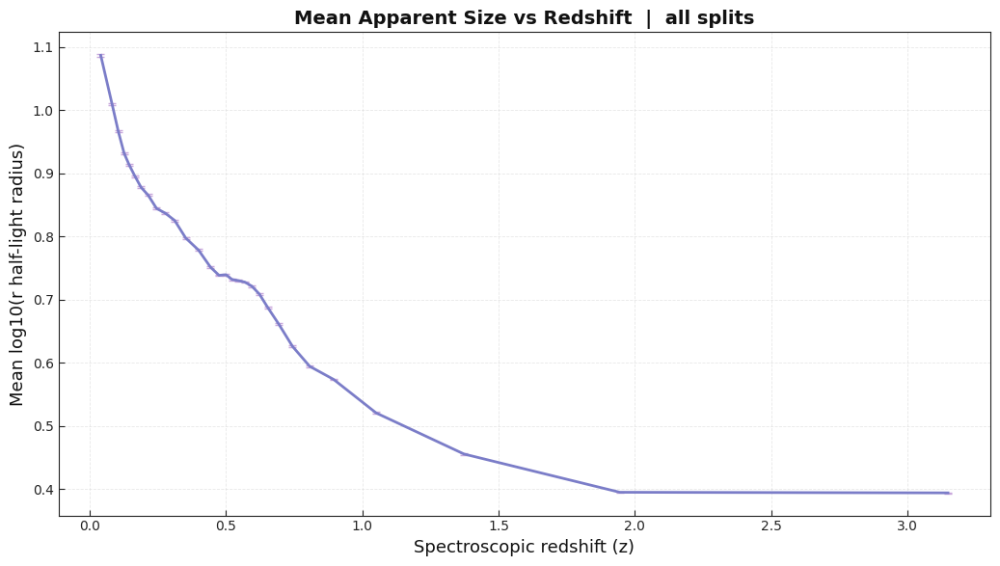

In [98]:
dat = load_keys(["specz_redshift","r_half_light_radius"])
z, hlr = dat["specz_redshift"], dat["r_half_light_radius"]
m = np.isfinite(z)&np.isfinite(hlr); z, hlr = z[m], hlr[m]

nb2 = 30; bins = np.quantile(z, np.linspace(0,1,nb2+1)); zc = 0.5*(bins[:-1]+bins[1:])
mean_log, se_log = np.full(nb2,np.nan), np.full(nb2,np.nan)
for k in range(nb2):
    sel = (z>=bins[k])&(z<bins[k+1]) if k<nb2-1 else (z>=bins[k])&(z<=bins[k+1])
    v = hlr[sel]; v = v[np.isfinite(v)&(v>0)]
    if v.size>=30: lv=np.log10(v); mean_log[k]=lv.mean(); se_log[k]=lv.std(ddof=1)/np.sqrt(v.size)

ok = np.isfinite(mean_log)&np.isfinite(se_log)
fig, ax = plt.subplots(figsize=(10.5, 6))
ax.errorbar(zc[ok], mean_log[ok], yerr=se_log[ok], fmt="-", linewidth=2, color=GP[3],
            ecolor=GP[1], capsize=3)
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("Mean log10(r half-light radius)", fontsize=13)
ax.set_title("Mean Apparent Size vs Redshift  |  all splits", fontsize=14)
ax.grid(True); plt.tight_layout(); plt.show()

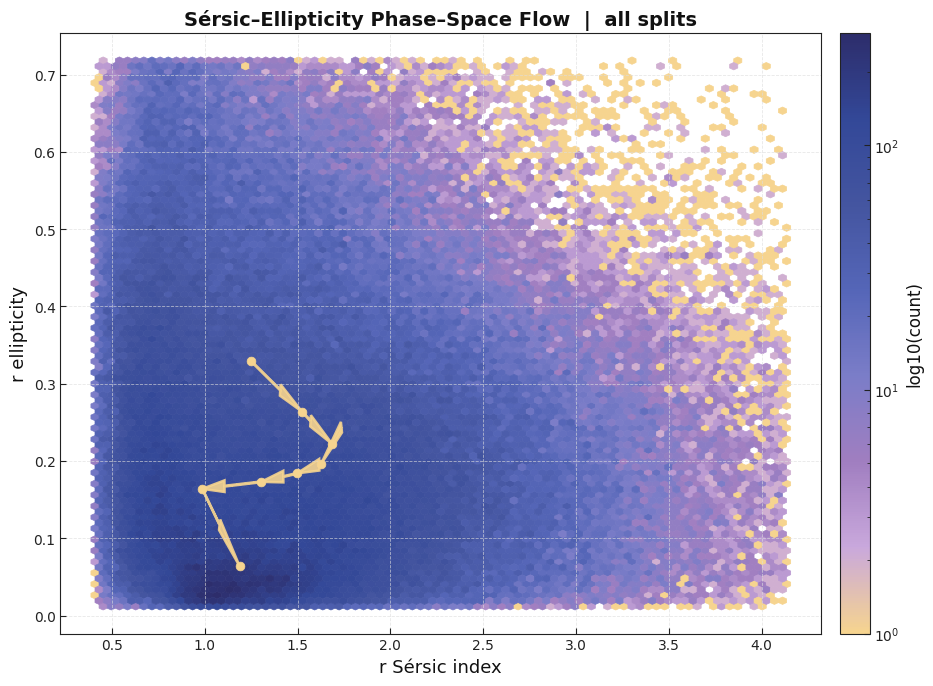

In [99]:
dat = load_keys(["specz_redshift","r_sersic_index","r_ellipticity"])
z, n, e = dat["specz_redshift"], dat["r_sersic_index"], dat["r_ellipticity"]
m = np.isfinite(z)&np.isfinite(n)&np.isfinite(e); z, n, e = z[m], n[m], e[m]
nmin,nmax = np.quantile(n,[0.01,0.99]); emin,emax = np.quantile(e,[0.01,0.99])
sel = (n>=nmin)&(n<=nmax)&(e>=emin)&(e<=emax); z, n, e = z[sel], n[sel], e[sel]

q = np.quantile(z, np.linspace(0,1,9))
cent = []
for k in range(len(q)-1):
    s = (z>=q[k])&(z<q[k+1]) if k<len(q)-2 else (z>=q[k])&(z<=q[k+1])
    cent.append((np.nan,np.nan) if s.sum()==0 else (np.median(n[s]),np.median(e[s])))
cent = np.array(cent)

fig, ax = plt.subplots(figsize=(10, 7))
hb = ax.hexbin(n, e, gridsize=85, bins="log", mincnt=1, cmap=GALAXY_CMAP)
ax.set_xlabel("r Sérsic index", fontsize=13); ax.set_ylabel("r ellipticity", fontsize=13)
ax.set_title("Sérsic–Ellipticity Phase–Space Flow  |  all splits", fontsize=14)
fig.colorbar(hb, ax=ax, pad=0.02).set_label("log10(count)", fontsize=12)
ok = np.isfinite(cent[:,0])&np.isfinite(cent[:,1]); cx, cy = cent[ok,0], cent[ok,1]
for i in range(len(cx)-1):
    ax.arrow(cx[i],cy[i],cx[i+1]-cx[i],cy[i+1]-cy[i],
             length_includes_head=True, head_width=0.015, head_length=0.12,
             linewidth=1.8, color=GP[0], alpha=0.9)
ax.scatter(cx, cy, s=40, color=GP[0], zorder=3)
plt.tight_layout(); plt.show()

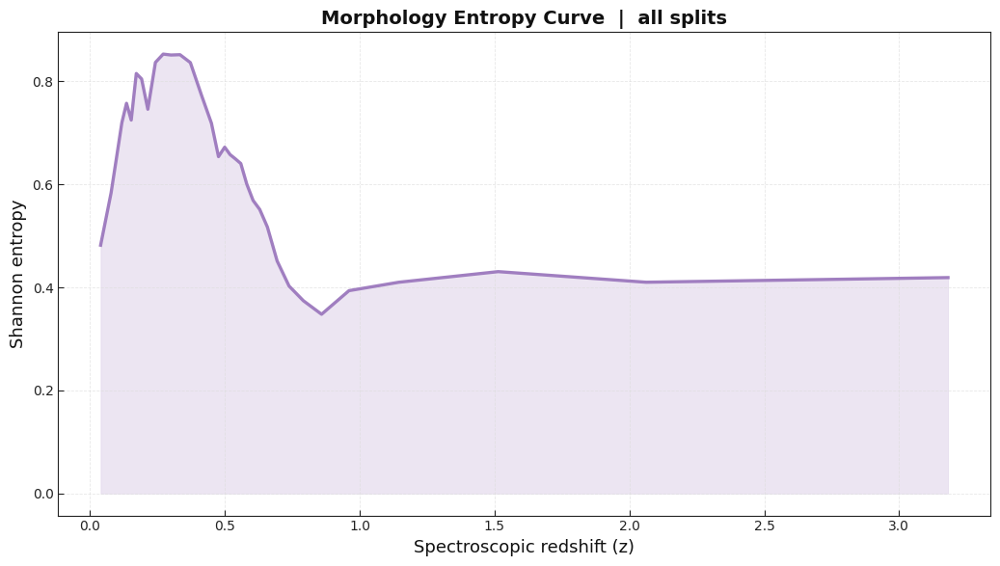

In [100]:
dat = load_keys(["specz_redshift","r_sersic_index"])
z, n = dat["specz_redshift"], dat["r_sersic_index"]
m = np.isfinite(z)&np.isfinite(n); z, n = z[m], n[m]
bins = np.quantile(z, np.linspace(0,1,35)); zc = 0.5*(bins[:-1]+bins[1:]); H = np.full_like(zc,np.nan)
for k in range(len(bins)-1):
    s = (z>=bins[k])&(z<bins[k+1]) if k<len(bins)-2 else (z>=bins[k])&(z<=bins[k+1])
    v = n[s]
    if v.size>=50:
        c0,c1,c2 = np.mean(v<2),np.mean((v>=2)&(v<=3)),np.mean(v>3)
        p = np.array([c0,c1,c2]); p = p[p>0]; H[k] = -np.sum(p*np.log(p))
ok = np.isfinite(H)
fig, ax = plt.subplots(figsize=(10.5, 6))
ax.plot(zc[ok], H[ok], linewidth=2.4, color=GP[2])
ax.fill_between(zc[ok], 0, H[ok], alpha=0.2, color=GP[2])
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=13)
ax.set_ylabel("Shannon entropy", fontsize=13)
ax.set_title("Morphology Entropy Curve  |  all splits", fontsize=14)
ax.grid(True); plt.tight_layout(); plt.show()

/var/folders/69/w3lrlv056t9dlrj1sbkzhvyc0000gn/T/ipykernel_34175/4098928244.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0.90,0.95]); plt.show()


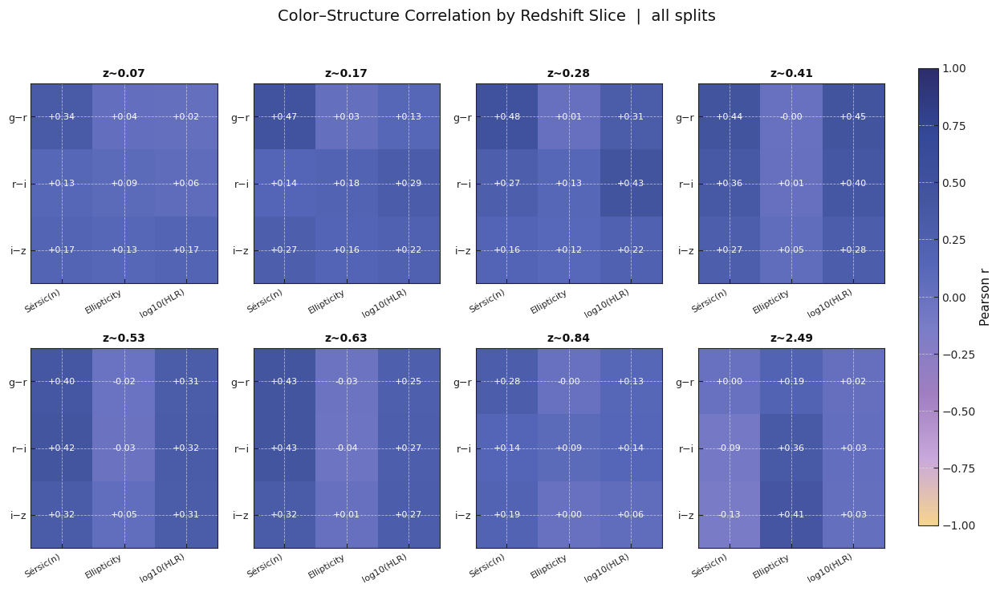

In [101]:
def pcorr(a, b):
    a, b = a-a.mean(), b-b.mean()
    da, db = np.sqrt((a*a).mean()), np.sqrt((b*b).mean())
    return float((a*b).mean()/(da*db)) if da>1e-12 and db>1e-12 else np.nan

dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag","z_cmodel_mag",
                  "r_sersic_index","r_ellipticity","r_half_light_radius"])
z = dat["specz_redshift"]
c_gr = dat["g_cmodel_mag"]-dat["r_cmodel_mag"]
c_ri = dat["r_cmodel_mag"]-dat["i_cmodel_mag"]
c_iz = dat["i_cmodel_mag"]-dat["z_cmodel_mag"]
s_hlr = np.log10(np.maximum(dat["r_half_light_radius"],1e-12))
n, e = dat["r_sersic_index"], dat["r_ellipticity"]

M = np.isfinite(z)&np.isfinite(c_gr)&np.isfinite(c_ri)&np.isfinite(c_iz)&np.isfinite(n)&np.isfinite(e)&np.isfinite(s_hlr)
z=z[M]; C=np.vstack([c_gr[M],c_ri[M],c_iz[M]]); S=np.vstack([n[M],e[M],s_hlr[M]])
zb=np.quantile(z,np.linspace(0,1,9)); zc_l=0.5*(zb[:-1]+zb[1:])
R=np.full((len(zc_l),3,3),np.nan)
for k in range(len(zb)-1):
    s=(z>=zb[k])&(z<zb[k+1]) if k<len(zb)-2 else (z>=zb[k])&(z<=zb[k+1])
    if s.sum()<80: continue
    for i0 in range(3):
        for j0 in range(3): R[k,i0,j0]=pcorr(C[i0,s],S[j0,s])

clbls=["g−r","r−i","i−z"]; slbls=["Sérsic(n)","Ellipticity","log10(HLR)"]
fig=plt.figure(figsize=(12.5,7.5))
for k in range(R.shape[0]):
    ax=plt.subplot(2,4,k+1)
    im=ax.imshow(R[k],vmin=-1,vmax=1,aspect="auto",cmap=GALAXY_CMAP)
    ax.set_xticks(range(3)); ax.set_yticks(range(3))
    ax.set_xticklabels(slbls,rotation=30,ha="right",fontsize=8)
    ax.set_yticklabels(clbls,fontsize=9); ax.set_title(f"z~{zc_l[k]:.2f}",fontsize=10)
    for i0 in range(3):
        for j0 in range(3):
            if np.isfinite(R[k,i0,j0]):
                ax.text(j0,i0,f"{R[k,i0,j0]:+.2f}",ha="center",va="center",fontsize=8,color="white")
cax=fig.add_axes([0.92,0.12,0.02,0.76]); fig.colorbar(im,cax=cax).set_label("Pearson r",fontsize=11)
fig.suptitle("Color–Structure Correlation by Redshift Slice  |  all splits",fontsize=14)
plt.tight_layout(rect=[0,0,0.90,0.95]); plt.show()

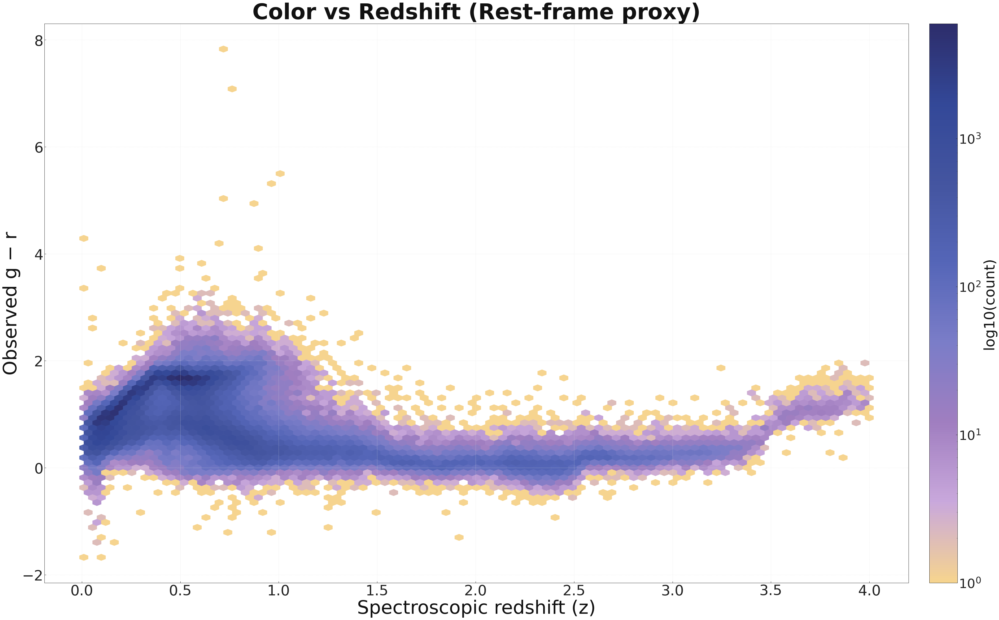

In [17]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag"])
z,g,r = dat["specz_redshift"],dat["g_cmodel_mag"],dat["r_cmodel_mag"]
gr = g-r; m = np.isfinite(z)&np.isfinite(gr)
fig, ax = plt.subplots(figsize=(42, 24))
hb = ax.hexbin(z[m], gr[m], gridsize=90, bins="log", mincnt=1, cmap=GALAXY_CMAP)
ax.set_xlabel("Spectroscopic redshift (z)", fontsize=52)
ax.set_ylabel("Observed g − r", fontsize=52)
ax.set_title("Color vs Redshift (Rest-frame proxy)", fontsize=60)
ax.tick_params(axis='both', labelsize=40)
cb = fig.colorbar(hb, ax=ax, pad=0.02)
cb.set_label("log10(count)", fontsize=40)
cb.ax.tick_params(labelsize=36)
plt.tight_layout()
plt.savefig("color_vs_redshift_large.png", dpi=300, bbox_inches="tight")
plt.show()

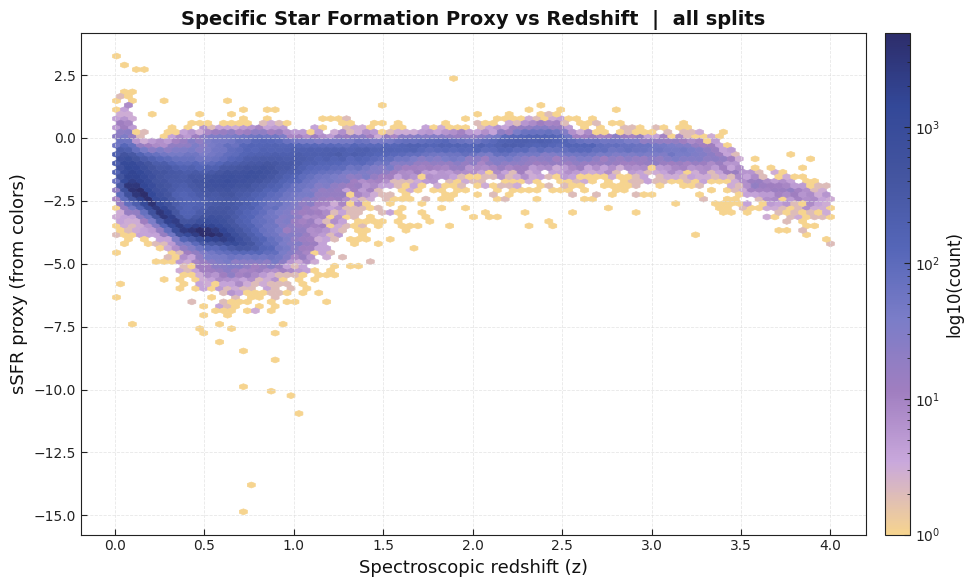

In [103]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag"])
z,g,r,i_mag = (dat[k] for k in ["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag"])
gr,ri = g-r,r-i_mag; m=np.isfinite(z)&np.isfinite(gr)&np.isfinite(ri); z,gr,ri=z[m],gr[m],ri[m]
sSFR_proxy = -1.8*gr-0.8*ri
fig, ax = plt.subplots(figsize=(10.5, 6))
hb = ax.hexbin(z, sSFR_proxy, gridsize=90, bins="log", mincnt=1, cmap=GALAXY_CMAP)
ax.set_xlabel("Spectroscopic redshift (z)",fontsize=13)
ax.set_ylabel("sSFR proxy (from colors)",fontsize=13)
ax.set_title("Specific Star Formation Proxy vs Redshift  |  all splits",fontsize=14)
fig.colorbar(hb,ax=ax,pad=0.02).set_label("log10(count)",fontsize=12)
plt.tight_layout(); plt.show()

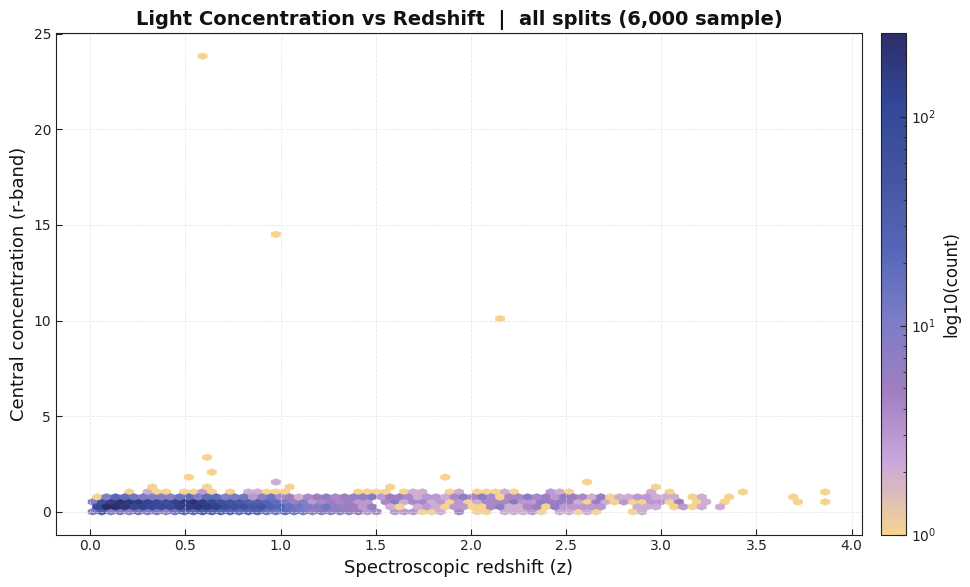

In [104]:
def central_concentration(img_chw, rad=8):
    h,w = img_chw.shape[-2],img_chw.shape[-1]; cy,cx=(h-1)/2.0,(w-1)/2.0
    rr = np.sqrt((np.ogrid[:h,:h][0]-cy)**2+(np.ogrid[:w,:w][1]-cx)**2)
    yy,xx = np.ogrid[:h,:w]; rr = np.sqrt((yy-cy)**2+(xx-cx)**2)
    band=img_chw[2]; tot=float(np.sum(band[rr<=h/2.0])); inn=float(np.sum(band[rr<=rad]))
    return inn/tot if np.isfinite(tot) and tot>0 else np.nan

SAMPLE_PER_SPLIT=2000; z_list,c_list=[],[]
for p in ALL_PATHS:
    with h5py.File(p,"r") as f:
        n_file=int(f["specz_redshift"].shape[0])
        idxs=np.random.choice(n_file,size=min(SAMPLE_PER_SPLIT,n_file),replace=False).astype(np.int64)
        for idx in tqdm(idxs,desc=f"Conc ({p.split('/')[-1][:5]})",unit="img",leave=False):
            img=np.array(f["image"][int(idx)],dtype=np.float32); zz=float(f["specz_redshift"][int(idx)])
            cc=central_concentration(img,rad=8)
            if np.isfinite(zz) and np.isfinite(cc): z_list.append(zz); c_list.append(cc)

z_arr,c_arr=np.array(z_list),np.array(c_list)
fig, ax = plt.subplots(figsize=(10.5, 6))
hb=ax.hexbin(z_arr,c_arr,gridsize=80,bins="log",mincnt=1,cmap=GALAXY_CMAP)
ax.set_xlabel("Spectroscopic redshift (z)",fontsize=13)
ax.set_ylabel("Central concentration (r-band)",fontsize=13)
ax.set_title("Light Concentration vs Redshift  |  all splits (6,000 sample)",fontsize=14)
fig.colorbar(hb,ax=ax,pad=0.02).set_label("log10(count)",fontsize=12)
plt.tight_layout(); plt.show()

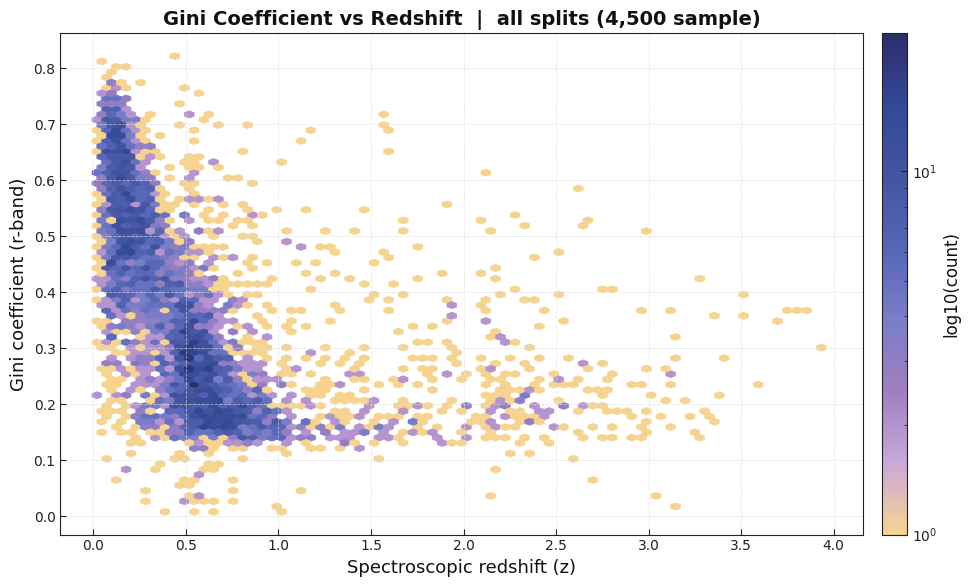

In [105]:
def gini_coefficient(x):
    x=np.asarray(x,dtype=np.float64).ravel(); x=x[np.isfinite(x)]
    if x.size==0: return np.nan
    x=x-np.min(x)
    if np.allclose(x,0): return 0.0
    x=np.sort(x); n=x.size
    return float((2.0*np.sum(np.arange(1,n+1)*x)/(n*np.sum(x)))-(n+1.0)/n)

SAMPLE_PER_SPLIT=1500; z_list,g_list=[],[]
for p in ALL_PATHS:
    with h5py.File(p,"r") as f:
        n_file=int(f["specz_redshift"].shape[0])
        idxs=np.random.choice(n_file,size=min(SAMPLE_PER_SPLIT,n_file),replace=False).astype(np.int64)
        for idx in tqdm(idxs,desc=f"Gini ({p.split('/')[-1][:5]})",unit="img",leave=False):
            img=np.array(f["image"][int(idx)],dtype=np.float32); zz=float(f["specz_redshift"][int(idx)])
            gi=gini_coefficient(img[2])
            if np.isfinite(zz) and np.isfinite(gi): z_list.append(zz); g_list.append(gi)

z_arr,g_arr=np.array(z_list),np.array(g_list)
fig, ax = plt.subplots(figsize=(10.5, 6))
hb=ax.hexbin(z_arr,g_arr,gridsize=75,bins="log",mincnt=1,cmap=GALAXY_CMAP)
ax.set_xlabel("Spectroscopic redshift (z)",fontsize=13)
ax.set_ylabel("Gini coefficient (r-band)",fontsize=13)
ax.set_title("Gini Coefficient vs Redshift  |  all splits (4,500 sample)",fontsize=14)
fig.colorbar(hb,ax=ax,pad=0.02).set_label("log10(count)",fontsize=12)
plt.tight_layout(); plt.show()

/var/folders/69/w3lrlv056t9dlrj1sbkzhvyc0000gn/T/ipykernel_34175/4218279402.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.95]); plt.show()


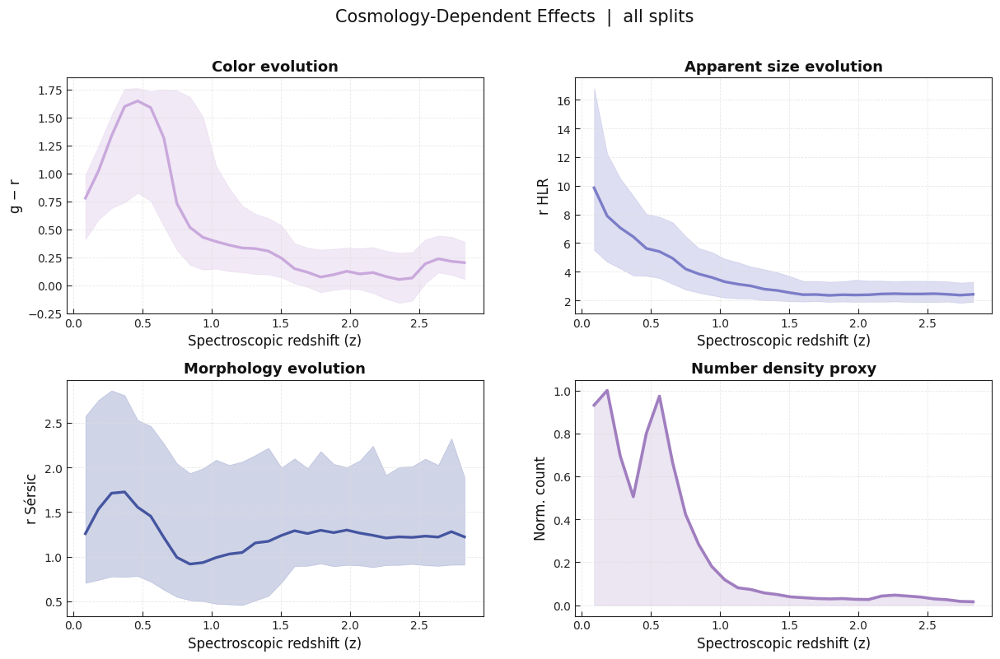

In [106]:
dat = load_keys(["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag",
                  "r_half_light_radius","r_sersic_index"])
z,g,r,i_mag=(dat[k] for k in ["specz_redshift","g_cmodel_mag","r_cmodel_mag","i_cmodel_mag"])
hlr,n=dat["r_half_light_radius"],dat["r_sersic_index"]; gr,ri=g-r,r-i_mag
m=np.isfinite(z)&np.isfinite(gr)&np.isfinite(ri)&np.isfinite(hlr)&np.isfinite(n)
z,gr,ri,hlr,n=z[m],gr[m],ri[m],hlr[m],n[m]; zmin,zmax=np.quantile(z,[0.01,0.99])
nb2=30; zb=np.linspace(zmin,zmax,nb2+1); zc=0.5*(zb[:-1]+zb[1:])

def bin_q(x,y,bins,qlo=0.10,qhi=0.90):
    med,lo,hi=[np.full(len(bins)-1,np.nan) for _ in range(3)]
    for k in range(len(bins)-1):
        sel=(x>=bins[k])&(x<bins[k+1]) if k<len(bins)-2 else (x>=bins[k])&(x<=bins[k+1])
        v=y[sel]
        if v.size>=40: med[k]=np.median(v); lo[k]=np.quantile(v,qlo); hi[k]=np.quantile(v,qhi)
    return med,lo,hi

counts=np.array([np.sum((z>=zb[k])&(z<zb[k+1])) for k in range(nb2)],dtype=float)
counts_norm=counts/counts.max()
fig=plt.figure(figsize=(14.5,8.5)); gs=GridSpec(2,2,hspace=0.28,wspace=0.22)
plot_args=[(*bin_q(z,gr,zb),"g − r","Color evolution",GP[1]),
           (*bin_q(z,hlr,zb),"r HLR","Apparent size evolution",GP[3]),
           (*bin_q(z,n,zb),"r Sérsic","Morphology evolution",GP[5]),
           (None,None,None,"Norm. count","Number density proxy",GP[2])]
for i,args in enumerate(plot_args):
    ax=fig.add_subplot(gs[i//2,i%2])
    med,lo,hi,ylabel,title,col=args
    if med is None:
        ax.plot(zc,counts_norm,linewidth=2.6,color=col); ax.fill_between(zc,0,counts_norm,alpha=0.2,color=col)
    else:
        ok=np.isfinite(med)&np.isfinite(lo)&np.isfinite(hi)
        ax.fill_between(zc[ok],lo[ok],hi[ok],alpha=0.25,color=col); ax.plot(zc[ok],med[ok],linewidth=2.4,color=col)
    ax.set_ylabel(ylabel,fontsize=12); ax.set_title(title,fontsize=13)
    ax.set_xlabel("Spectroscopic redshift (z)",fontsize=12); ax.grid(True)
fig.suptitle("Cosmology-Dependent Effects  |  all splits",fontsize=15)
plt.tight_layout(rect=[0,0,1,0.95]); plt.show()

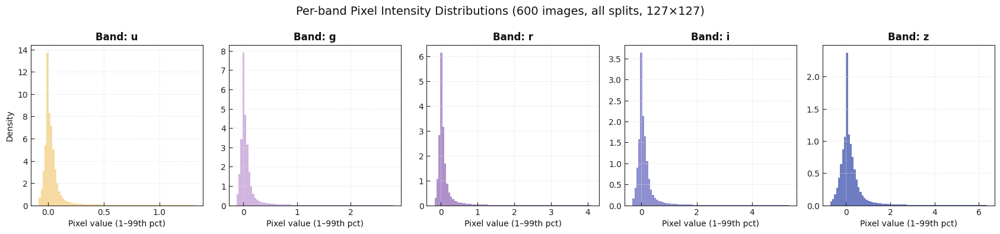

In [107]:

N_SAMPLE=200; BAND_NAMES=["u","g","r","i","z"]; band_pixels=[[] for _ in range(5)]
for p in ALL_PATHS:
    with h5py.File(p,"r") as f:
        img_ds=f["image"]; n_total=int(img_ds.shape[0])
        idxs=np.random.choice(n_total,size=min(N_SAMPLE,n_total),replace=False).astype(np.int64)
        for idx in idxs:
            img=np.array(img_ds[int(idx)],dtype=np.float32)
            for b in range(5): band_pixels[b].append(img[b].ravel())

fig, axes = plt.subplots(1, 5, figsize=(17, 4))
for b, ax in enumerate(axes):
    vals=np.concatenate(band_pixels[b])
    lo,hi=np.nanpercentile(vals,1),np.nanpercentile(vals,99)
    ax.hist(vals[(vals>=lo)&(vals<=hi)],bins=80,density=True,color=GP[b],alpha=0.85,edgecolor="none")
    ax.set_title(f"Band: {BAND_NAMES[b]}",fontsize=12)
    ax.set_xlabel("Pixel value (1–99th pct)",fontsize=10)
    if b==0: ax.set_ylabel("Density",fontsize=10)
    ax.grid(True)
fig.suptitle("Per-band Pixel Intensity Distributions (600 images, all splits, 127×127)",fontsize=14)
plt.tight_layout(); plt.show()

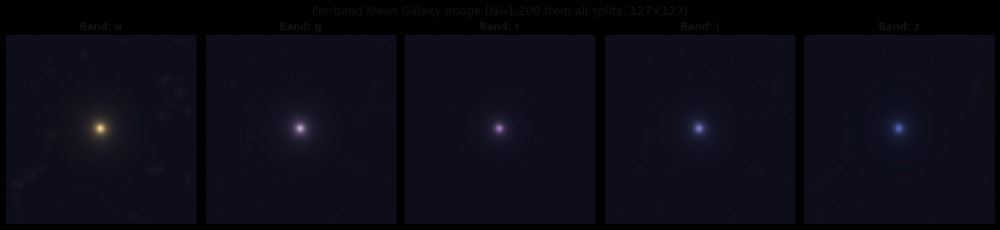

In [108]:

N_MEAN=400; IMG_SIZE=127; BAND_NAMES=["u","g","r","i","z"]
accum=np.zeros((5,IMG_SIZE,IMG_SIZE),dtype=np.float64); count=0
for p in ALL_PATHS:
    with h5py.File(p,"r") as f:
        img_ds=f["image"]; n_total=int(img_ds.shape[0])
        idxs=np.random.choice(n_total,size=min(N_MEAN,n_total),replace=False).astype(np.int64)
        for idx in idxs: accum+=np.array(img_ds[int(idx)],dtype=np.float64); count+=1
mean_img=accum/count

fig, axes = plt.subplots(1, 5, figsize=(17, 4))
fig.patch.set_facecolor("black")
band_cmaps=[LinearSegmentedColormap.from_list(f"b{b}",["#0D0D1A",GP[b]]) for b in range(5)]
for b, ax in enumerate(axes):
    ax.imshow(norm01(mean_img[b].astype(np.float32)),cmap=band_cmaps[b],origin="upper")
    ax.set_title(f"Band: {BAND_NAMES[b]}",fontsize=12); ax.axis("off")
    ax.set_facecolor("black")
fig.suptitle(f"Per-band Mean Galaxy Image (N={count:,} from all splits, 127×127)",fontsize=14)
plt.tight_layout(); plt.show()

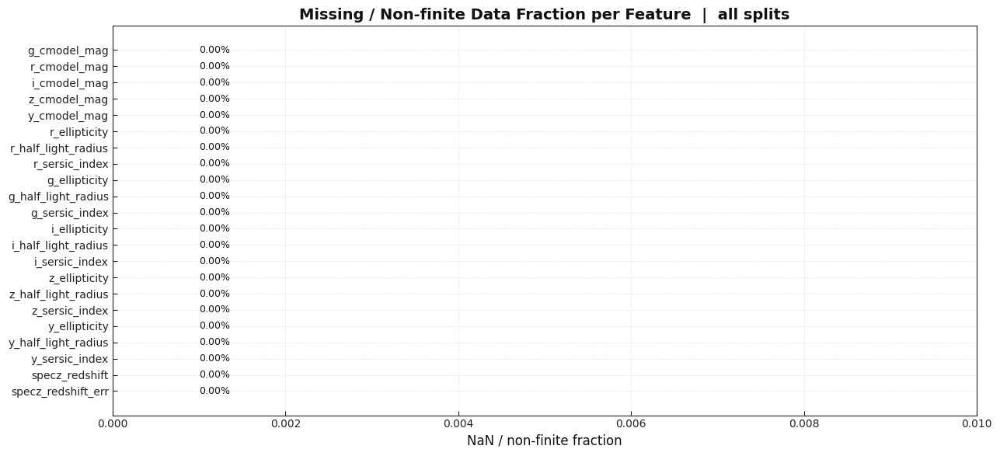

In [109]:

feature_check_keys=[
    'g_cmodel_mag','r_cmodel_mag','i_cmodel_mag','z_cmodel_mag','y_cmodel_mag',
    'r_ellipticity','r_half_light_radius','r_sersic_index',
    'g_ellipticity','g_half_light_radius','g_sersic_index',
    'i_ellipticity','i_half_light_radius','i_sersic_index',
    'z_ellipticity','z_half_light_radius','z_sersic_index',
    'y_ellipticity','y_half_light_radius','y_sersic_index',
    'specz_redshift','specz_redshift_err',
]
nan_fracs={}
for key in feature_check_keys:
    arr=load_key(key)
    nan_fracs[key]=np.sum(~np.isfinite(arr))/arr.size if arr.size>0 else np.nan

keys_sorted=sorted(nan_fracs,key=lambda k: nan_fracs[k] if np.isfinite(nan_fracs[k]) else -1,reverse=True)
fracs=[nan_fracs[k] for k in keys_sorted]

fig, ax = plt.subplots(figsize=(13, 6))
colors_bar=[GP[0] if f<0.05 else GP[3] if f<0.20 else GP[6] for f in fracs]
bars=ax.barh(keys_sorted,fracs,color=colors_bar,alpha=0.88)
ax.set_xlabel("NaN / non-finite fraction",fontsize=12)
ax.set_title("Missing / Non-finite Data Fraction per Feature  |  all splits",fontsize=14)
ax.set_xlim(0,max(fracs)*1.15+0.01); ax.invert_yaxis()
for bar,frac in zip(bars,fracs):
    ax.text(frac+0.001,bar.get_y()+bar.get_height()/2,f"{frac:.2%}",va="center",fontsize=9)
ax.grid(True,axis="x"); plt.tight_layout(); plt.show()

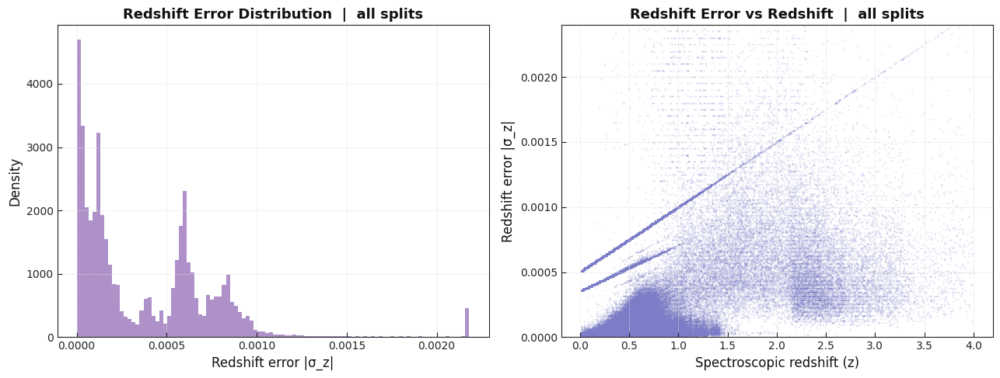

Median |σ_z| : 0.00023
Mean   |σ_z| : 0.00041
Max    |σ_z| : 0.02120


In [110]:

z_all=load_key("specz_redshift"); ze_all=load_key("specz_redshift_err")
mask=np.isfinite(z_all)&np.isfinite(ze_all)&(ze_all>=0)
z_clean,ze_clean=z_all[mask],ze_all[mask]

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].hist(np.clip(ze_clean,0,np.quantile(ze_clean,0.99)),bins=100,density=True,
             color=GP[2],alpha=0.85,edgecolor="none")
axes[0].set_xlabel("Redshift error |σ_z|",fontsize=12); axes[0].set_ylabel("Density",fontsize=12)
axes[0].set_title("Redshift Error Distribution  |  all splits",fontsize=13); axes[0].grid(True)

axes[1].scatter(z_clean,ze_clean,s=1,alpha=0.15,color=GP[3],rasterized=True)
axes[1].set_xlabel("Spectroscopic redshift (z)",fontsize=12)
axes[1].set_ylabel("Redshift error |σ_z|",fontsize=12)
axes[1].set_title("Redshift Error vs Redshift  |  all splits",fontsize=13)
axes[1].set_ylim(0,np.quantile(ze_clean,0.99)*1.1); axes[1].grid(True)
plt.tight_layout(); plt.show()
print(f"Median |σ_z| : {np.median(ze_clean):.5f}")
print(f"Mean   |σ_z| : {np.mean(ze_clean):.5f}")
print(f"Max    |σ_z| : {np.max(ze_clean):.5f}")

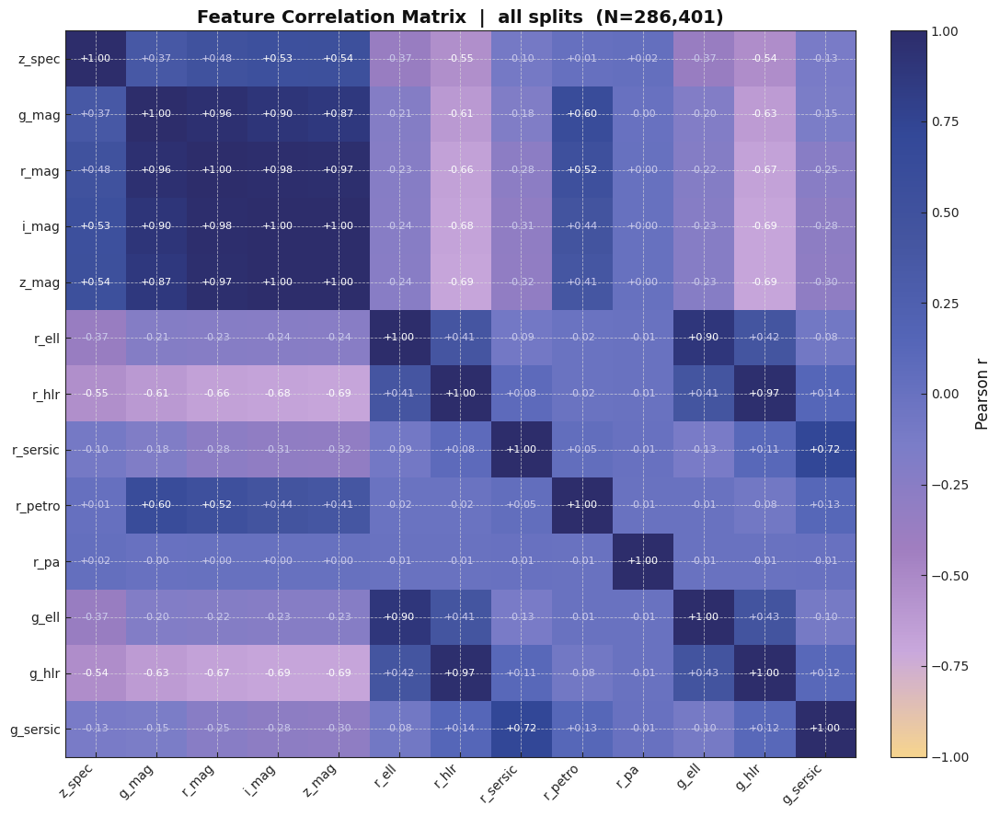

In [111]:

import warnings
corr_keys=['specz_redshift','g_cmodel_mag','r_cmodel_mag','i_cmodel_mag','z_cmodel_mag',
            'r_ellipticity','r_half_light_radius','r_sersic_index',
            'r_petro_rad','r_pos_angle','g_ellipticity','g_half_light_radius','g_sersic_index']
short_lbl=['z_spec','g_mag','r_mag','i_mag','z_mag',
           'r_ell','r_hlr','r_sersic','r_petro','r_pa','g_ell','g_hlr','g_sersic']

arrays,valid_lbl=[],[]
for key,lbl in zip(corr_keys,short_lbl):
    arr=load_key(key)
    if arr.size>0: arrays.append(arr); valid_lbl.append(lbl)
X_corr=np.column_stack(arrays)
mask_all=np.all(np.isfinite(X_corr),axis=1); X_corr=X_corr[mask_all]
with warnings.catch_warnings():
    warnings.simplefilter("ignore"); C=np.corrcoef(X_corr.T)

fig, ax = plt.subplots(figsize=(11, 9))
im=ax.imshow(C,cmap=GALAXY_CMAP,vmin=-1,vmax=1,aspect="auto")
ax.set_xticks(range(len(valid_lbl))); ax.set_yticks(range(len(valid_lbl)))
ax.set_xticklabels(valid_lbl,rotation=45,ha="right",fontsize=10)
ax.set_yticklabels(valid_lbl,fontsize=10)
for i in range(len(valid_lbl)):
    for j in range(len(valid_lbl)):
        ax.text(j,i,f"{C[i,j]:+.2f}",ha="center",va="center",fontsize=8,
                color="white" if abs(C[i,j])>0.5 else "#CCCCEE")
plt.colorbar(im,ax=ax,fraction=0.046,pad=0.04).set_label("Pearson r",fontsize=12)
ax.set_title(f"Feature Correlation Matrix  |  all splits  (N={mask_all.sum():,})",fontsize=14)
plt.tight_layout(); plt.show()

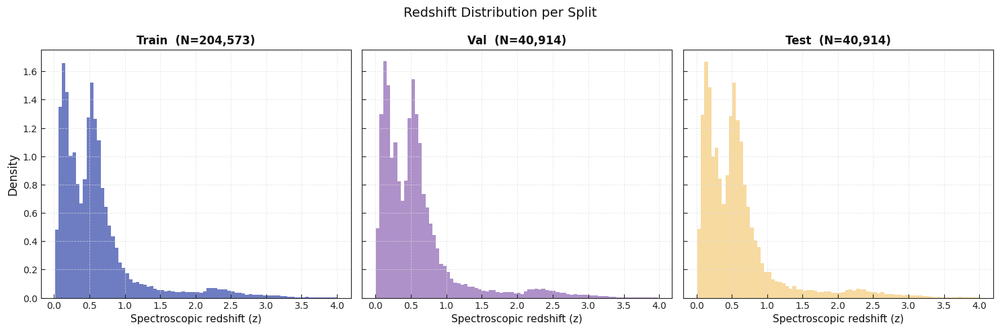

In [112]:

fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
for ax, (split, p) in zip(axes, SPLIT_PATHS.items()):
    with h5py.File(p,"r") as f: z=np.array(f["specz_redshift"][:],dtype=np.float64)
    z=z[np.isfinite(z)]
    ax.hist(z,bins=80,density=True,color=SPLIT_COLORS[split],alpha=0.85,edgecolor="none")
    ax.set_title(f"{split.capitalize()}  (N={len(z):,})",fontsize=12)
    ax.set_xlabel("Spectroscopic redshift (z)",fontsize=11); ax.grid(True)
axes[0].set_ylabel("Density",fontsize=12)
fig.suptitle("Redshift Distribution per Split",fontsize=14)
plt.tight_layout(); plt.show()

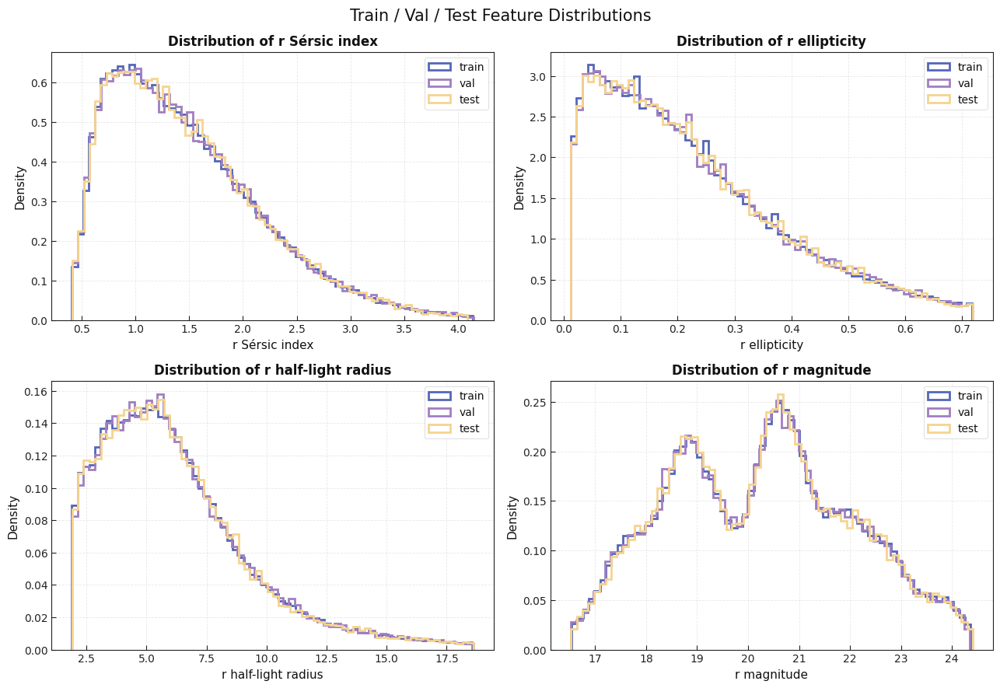

In [113]:

compare_features={
    "r Sérsic index":"r_sersic_index",
    "r ellipticity":"r_ellipticity",
    "r half-light radius":"r_half_light_radius",
    "r magnitude":"r_cmodel_mag",
}
fig, axes = plt.subplots(2, 2, figsize=(13, 9)); axes=axes.ravel()
for ax, (label,key) in zip(axes, compare_features.items()):
    for split,p in SPLIT_PATHS.items():
        with h5py.File(p,"r") as f:
            if key not in f: continue
            v=np.array(f[key][:],dtype=np.float64)
        v=v[np.isfinite(v)]; lo,hi=np.quantile(v,0.01),np.quantile(v,0.99)
        ax.hist(v[(v>=lo)&(v<=hi)],bins=70,density=True,histtype="step",
                linewidth=2,color=SPLIT_COLORS[split],label=split)
    ax.set_xlabel(label,fontsize=11); ax.set_ylabel("Density",fontsize=11)
    ax.set_title(f"Distribution of {label}",fontsize=12)
    ax.legend(fontsize=10); ax.grid(True)
fig.suptitle("Train / Val / Test Feature Distributions",fontsize=15)
plt.tight_layout(); plt.show()

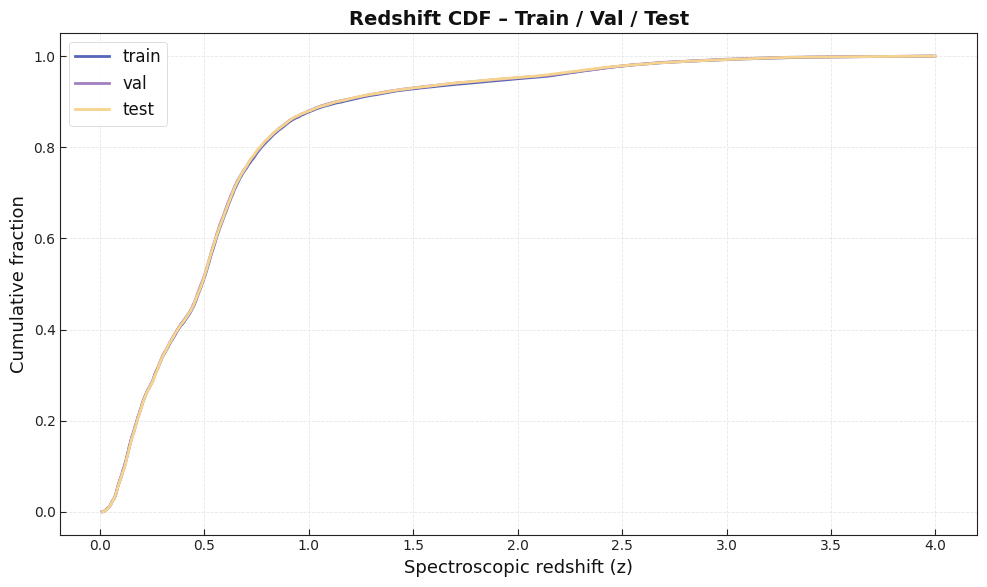

In [114]:

fig, ax = plt.subplots(figsize=(10, 6))
for split,p in SPLIT_PATHS.items():
    with h5py.File(p,"r") as f: z=np.array(f["specz_redshift"][:],dtype=np.float64)
    z=np.sort(z[np.isfinite(z)]); cdf=np.arange(1,len(z)+1)/len(z)
    ax.plot(z,cdf,linewidth=2,color=SPLIT_COLORS[split],label=split)
ax.set_xlabel("Spectroscopic redshift (z)",fontsize=13)
ax.set_ylabel("Cumulative fraction",fontsize=13)
ax.set_title("Redshift CDF – Train / Val / Test",fontsize=14)
ax.legend(fontsize=12); ax.grid(True); plt.tight_layout(); plt.show()

In [115]:

summary_rows=[]
check_keys=["specz_redshift","r_sersic_index","r_ellipticity","r_half_light_radius","r_cmodel_mag"]
for split,p in SPLIT_PATHS.items():
    with h5py.File(p,"r") as f:
        for key in check_keys:
            if key not in f: continue
            v=np.array(f[key][:],dtype=np.float64); v=v[np.isfinite(v)]
            summary_rows.append({"split":split,"feature":key,"N":len(v),
                "mean":round(float(v.mean()),4),"std":round(float(v.std()),4),
                "p10":round(float(np.quantile(v,0.10)),4),
                "p50":round(float(np.quantile(v,0.50)),4),
                "p90":round(float(np.quantile(v,0.90)),4)})

df_summary=pd.DataFrame(summary_rows)
pd.set_option("display.max_rows",60); pd.set_option("display.float_format","{:.4f}".format)
df_summary

,split,feature,N,mean,std,p10,p50,p90
0,train,specz_redshift,204573,0.5950,0.5730,0.1164,0.4890,1.1618
1,train,r_sersic_index,204573,1.5130,0.8123,0.6770,1.3540,2.5310
2,train,r_ellipticity,204573,0.2311,0.1688,0.0460,0.1930,0.4780
3,train,r_half_light_radius,204573,6.3507,3.4446,2.7620,5.6520,10.7080
4,train,r_cmodel_mag,204573,20.2464,1.8800,17.7889,20.3097,22.7907
5,val,specz_redshift,40914,0.5890,0.5650,0.1180,0.4845,1.1305
6,val,r_sersic_index,40914,1.5202,0.8147,0.6770,1.3600,2.5460
7,val,r_ellipticity,40914,0.2323,0.1688,0.0470,0.1940,0.4820
8,val,r_half_light_radius,40914,6.3702,3.4460,2.7890,5.6480,10.7437
9,val,r_cmodel_mag,40914,20.2327,1.8729,17.7974,20.2966,22.7582
